In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [ ]:
# loading the data from csv file to a Pandas DataFrame
insurance_dataset = pd.read_csv('/content/insurance.csv')

In [ ]:
# first 5 rows of the dataframe
insurance_dataset.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


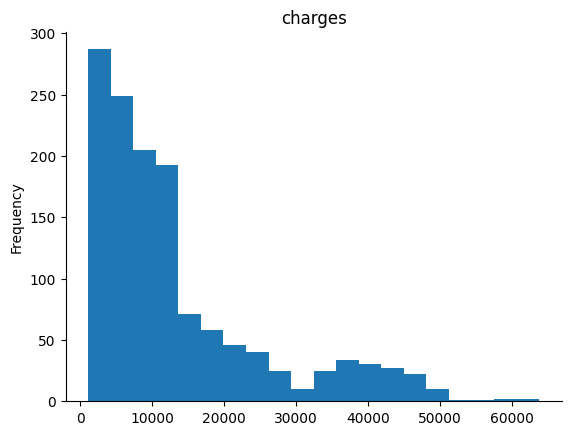

In [ ]:


from matplotlib import pyplot as plt
insurance_dataset['charges'].plot(kind='hist', bins=20, title='charges')
plt.gca().spines[['top', 'right',]].set_visible(False)

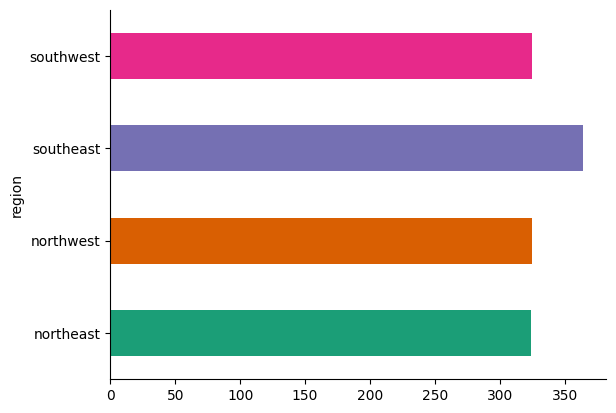

In [ ]:


from matplotlib import pyplot as plt
import seaborn as sns
insurance_dataset.groupby('region').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

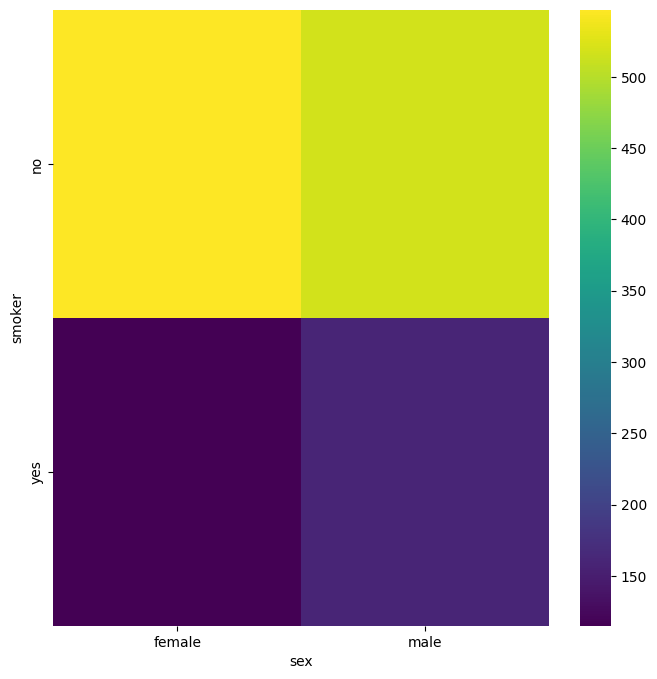

In [ ]:


from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['smoker'].value_counts()
    for x_label, grp in insurance_dataset.groupby('sex')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('sex')
_ = plt.ylabel('smoker')

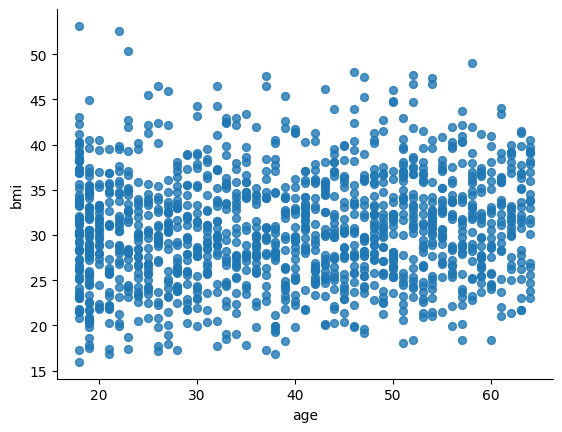

In [ ]:


from matplotlib import pyplot as plt
insurance_dataset.plot(kind='scatter', x='age', y='bmi', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
# prompt: Using dataframe insurance_dataset: scatter

import altair as alt

# Create a scatter plot of charges vs. age, colored by smoker status
alt.Chart(insurance_dataset).mark_point().encode(
    x='age',
    y='charges',
    color='smoker'
)


alt.Chart(...)

In [ ]:
insurance_dataset.isnull().sum()

,0
age,0
sex,0
bmi,0
children,0
smoker,0
region,0
charges,0


In [ ]:
# number of rows and columns
insurance_dataset.shape

(1338, 7)

In [ ]:
# getting some informations about the dataset
insurance_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


Categorical Features:

Sex
Smoker
Region

In [ ]:
# checking for missing values
insurance_dataset.isnull().sum()

,0
age,0
sex,0
bmi,0
children,0
smoker,0
region,0
charges,0


In [ ]:
# statistical Measures of the dataset
insurance_dataset.describe()# statistical Measures of the dataset
insurance_dataset.describe()

,age,bmi,children,charges
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


<ipython-input-14-28228e9c3528>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(insurance_dataset['age'])


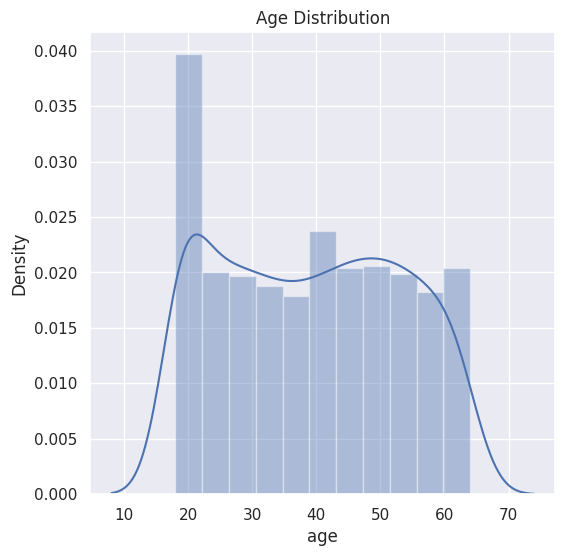

In [ ]:
# distribution of age value
sns.set()
plt.figure(figsize=(6,6))
sns.distplot(insurance_dataset['age'])
plt.title('Age Distribution')
plt.show()

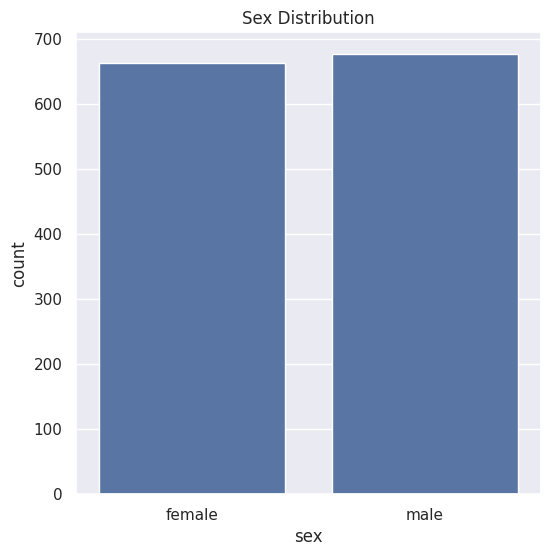

In [ ]:
# Gender column
plt.figure(figsize=(6,6))
sns.countplot(x='sex', data=insurance_dataset)
plt.title('Sex Distribution')
plt.show()

In [ ]:
insurance_dataset['sex'].value_counts()

,count
sex,
male,676
female,662


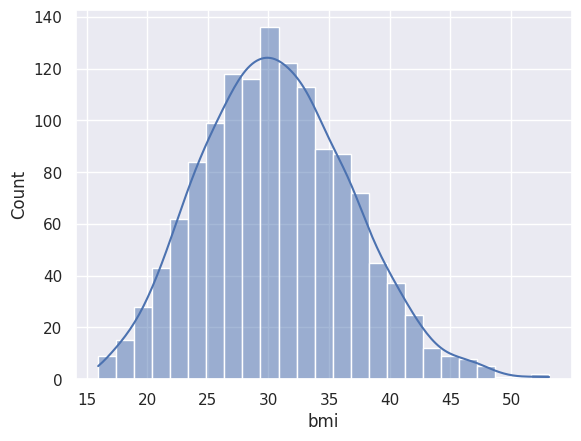

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Use histplot instead of distplot
sns.histplot(insurance_dataset['bmi'], kde=True)

# Show the plot
plt.show()

Normal BMI Range --> 18.5 to 24.9

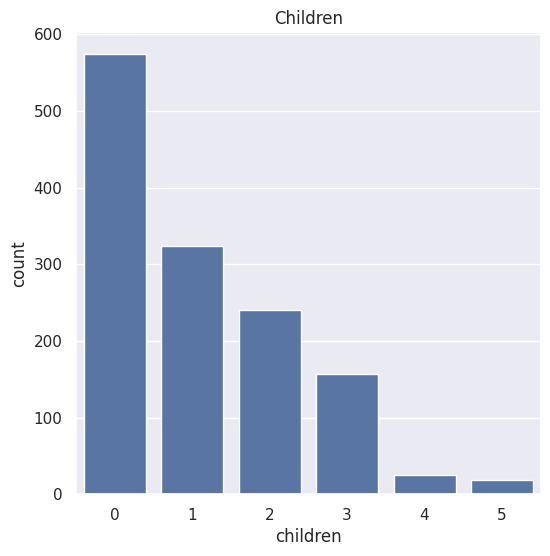

In [ ]:
# children column
plt.figure(figsize=(6,6))
sns.countplot(x='children', data=insurance_dataset)
plt.title('Children')
plt.show()

In [ ]:
insurance_dataset['children'].value_counts()

,count
children,
0,574
1,324
2,240
3,157
4,25
5,18


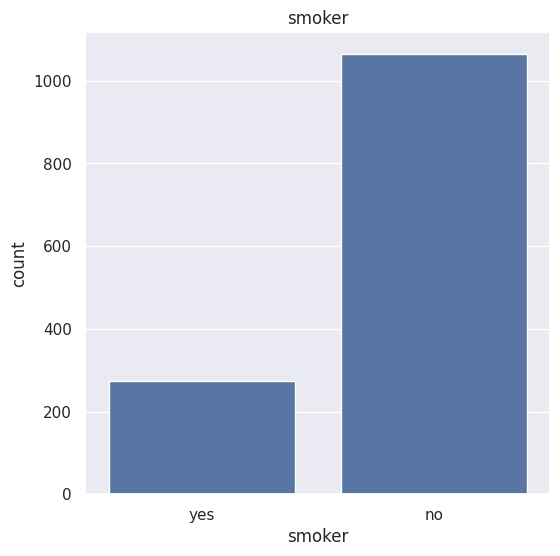

In [ ]:
# smoker column
plt.figure(figsize=(6,6))
sns.countplot(x='smoker', data=insurance_dataset)
plt.title('smoker')
plt.show()

In [ ]:
insurance_dataset['smoker'].value_counts()

,count
smoker,
no,1064
yes,274


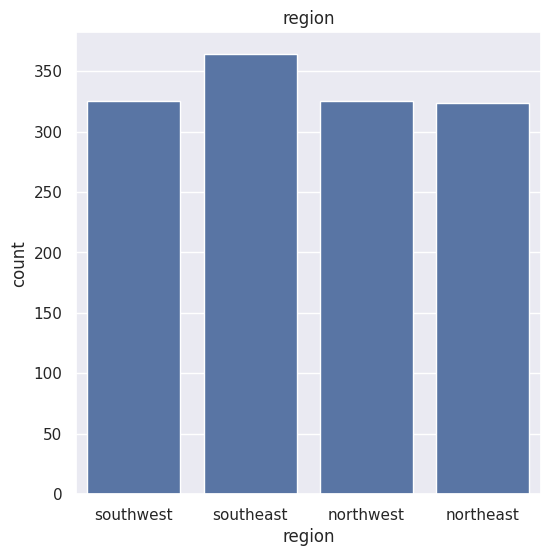

In [ ]:
# region column
plt.figure(figsize=(6,6))
sns.countplot(x='region', data=insurance_dataset)
plt.title('region')
plt.show()

In [ ]:
insurance_dataset['region'].value_counts()

,count
region,
southeast,364
southwest,325
northwest,325
northeast,324


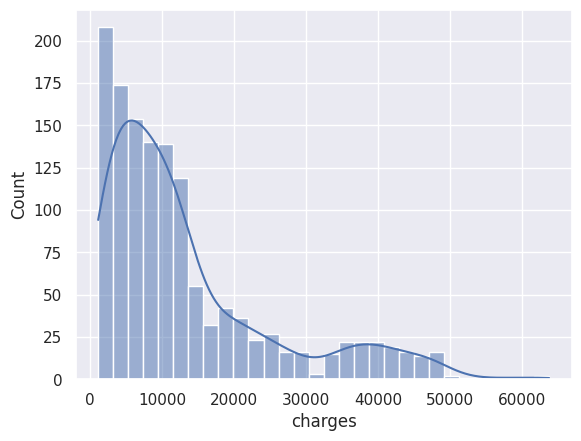

In [ ]:
# distribution of charges value
import seaborn as sns
import matplotlib.pyplot as plt
sns.histplot(insurance_dataset['charges'], kde=True)

# Show the plot
plt.show()


data preprocessing

In [ ]:
insurance_dataset['sex'] = insurance_dataset['sex'].replace({'male': 0, 'female': 1}).astype(int)
insurance_dataset['smoker'] = insurance_dataset['smoker'].replace({'yes': 0, 'no': 1}).astype(int)
insurance_dataset['region'] = insurance_dataset['region'].replace({'southeast': 0, 'southwest': 1, 'northeast': 2, 'northwest': 3}).astype(int)


<ipython-input-25-fbb9f1eb105b>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  insurance_dataset['sex'] = insurance_dataset['sex'].replace({'male': 0, 'female': 1}).astype(int)
<ipython-input-25-fbb9f1eb105b>:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  insurance_dataset['smoker'] = insurance_dataset['smoker'].replace({'yes': 0, 'no': 1}).astype(int)
<ipython-input-25-fbb9f1eb105b>:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly

Splitting the Features and Target

In [ ]:
X = insurance_dataset.drop(columns='charges', axis=1)
Y = insurance_dataset['charges']
print(X)

      age  sex     bmi  children  smoker  region
0      19    1  27.900         0       0       1
1      18    0  33.770         1       1       0
2      28    0  33.000         3       1       0
3      33    0  22.705         0       1       3
4      32    0  28.880         0       1       3
...   ...  ...     ...       ...     ...     ...
1333   50    0  30.970         3       1       3
1334   18    1  31.920         0       1       2
1335   18    1  36.850         0       1       0
1336   21    1  25.800         0       1       1
1337   61    1  29.070         0       0       3

[1338 rows x 6 columns]


In [ ]:
print(Y)

0       16884.92400
1        1725.55230
2        4449.46200
3       21984.47061
4        3866.85520
           ...     
1333    10600.54830
1334     2205.98080
1335     1629.83350
1336     2007.94500
1337    29141.36030
Name: charges, Length: 1338, dtype: float64


Splitting the data into Training data & Testing Data

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [ ]:
print(X.shape, X_train.shape, X_test.shape)

(1338, 6) (1070, 6) (268, 6)


Model Training

Linear Regression

In [ ]:
# loading the Linear Regression model
regressor = LinearRegression()

In [ ]:
regressor.fit(X_train, Y_train)

LinearRegression()

In [ ]:
#Model Evaluation
# prediction on training data
training_data_prediction =regressor.predict(X_train)

In [ ]:
# R squared value
r2_train = metrics.r2_score(Y_train, training_data_prediction)
print('R squared vale : ', r2_train)

R squared vale :  0.751505643411174


In [ ]:
# prediction on test data
test_data_prediction = regressor.predict(X_test)

mae = metrics.mean_absolute_error(Y_test, test_data_prediction)  # MAE
mse = metrics.mean_squared_error(Y_test, test_data_prediction)  # MSE
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")

Mean Absolute Error (MAE): 4267.2138
Mean Squared Error (MSE): 38337035.4864


In [ ]:
# prediction on test data
test_data_prediction =regressor.predict(X_test)

In [ ]:
#
from sklearn import metrics

# R squared value
r2_test = metrics.r2_score(Y_test, test_data_prediction)
print('R squared vale : ', r2_test)
# R squared value
r2_test = metrics.r2_score(Y_test, test_data_prediction)
print('R squared vale : ', r2_test)

R squared vale :  0.7447273869684077
R squared vale :  0.7447273869684077


Building a Predictive System

In [ ]:
import warnings
warnings.simplefilter("ignore")
input_data = (31,1,25.74,0,1,0)

# changing input_data to a numpy array
input_data_as_numpy_array = np.asarray(input_data)

# reshape the array
input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)

prediction = regressor.predict(input_data_reshaped)
print(prediction)

print('The insurance cost is USD ', prediction[0])

[3760.0805765]
The insurance cost is USD  3760.080576496055


LASSO REGRESSION


In [ ]:

from sklearn.preprocessing import StandardScaler
# Import Lasso
from sklearn.linear_model import Lasso




In [ ]:
# Split dataset
# Changed 'y' to 'Y' in the train_test_split function call
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [ ]:
# Scale features
scaler = StandardScaler() # StandardScaler was not imported before
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
# Load the Lasso Regression model
lasso_regressor = Lasso(alpha=1.0)  # Alpha controls regularization strength
lasso_regressor.fit(X_train, Y_train)

Lasso()

In [ ]:
# Model Evaluation

# Prediction on training data
train_pred = lasso_regressor.predict(X_train)
r2_train = metrics.r2_score(Y_train, train_pred)
print("Lasso Regression - R squared (Train):", r2_train)

Lasso Regression - R squared (Train): 0.7413130735313243


In [ ]:
# Prediction on test data
test_pred = lasso_regressor.predict(X_test)  # Get predictions for test data
mae = metrics.mean_absolute_error(Y_test, test_pred)  # MAE, use Y_test and test_pred
mse = metrics.mean_squared_error(Y_test, test_pred)  # MSE, use Y_test and test_pred
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")

Mean Absolute Error (MAE): 4190.4745
Mean Squared Error (MSE): 33689145.4800


In [ ]:
# Prediction on test data
test_pred = lasso_regressor.predict(X_test)
r2_test = metrics.r2_score(Y_test, test_pred)
print("Lasso Regression - R squared (Test):", r2_test)


Lasso Regression - R squared (Test): 0.7829989001760647


In [ ]:
# Building a Predictive System
input_data = (31, 1, 25.74, 0, 1, 0)  # Example input

# Convert input to NumPy array and reshape
input_data_as_numpy_array = np.asarray(input_data).reshape(1, -1)

# Scale input data
input_data_scaled = scaler.transform(input_data_as_numpy_array)

# Make prediction
prediction = lasso_regressor.predict(input_data_scaled)
print("The insurance cost (Lasso) is USD", prediction[0])

The insurance cost (Lasso) is USD 4020.4871394953734


PREVENT OVERFITTING:Ridge regression



In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn import metrics
import warnings

warnings.simplefilter("ignore")

In [ ]:
# loading the data from csv file to a Pandas DataFrame
insurance_dataset = pd.read_csv('/content/insurance.csv')

In [ ]:
# Preprocessing (One-hot encoding categorical variables)
categorical_cols = ['sex', 'smoker', 'region']
df = pd.get_dummies(insurance_dataset, columns=categorical_cols, drop_first=True)
X = df.drop(columns=['charges'])  # Features
y = df['charges']  # Target variable

In [ ]:
# Split dataset
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
ridge_regressor = Ridge(alpha=1.0)  # alpha controls regularization strength
ridge_regressor.fit(X_train, Y_train)

Ridge()

In [ ]:
# Prediction on training data
train_predictions = ridge_regressor.predict(X_train)
r2_train = metrics.r2_score(Y_train, train_predictions)
print("R squared value (Train):", r2_train)

R squared value (Train): 0.7417249011736953


In [ ]:
# Prediction on test data
test_predictions = ridge_regressor.predict(X_test)
r2_test = metrics.r2_score(Y_test, test_predictions)
print("R squared value (Test):", r2_test)

R squared value (Test): 0.7835410749121386


In [ ]:
# Prediction on test data
from sklearn import metrics

test_predictions = ridge_regressor.predict(X_test)  # Define test_predictions here
r2_test = metrics.r2_score(Y_test, test_predictions)
print("R squared value (Test):", r2_test)

# Calculate MAE using test_predictions
mae_test = metrics.mean_absolute_error(Y_test, test_predictions)
print("Mean Absolute Error (Test):", mae_test)

R squared value (Test): 0.7835410749121386
Mean Absolute Error (Test): 4182.7965965832645


In [ ]:
# Example input with all 8 features (including encoded categorical values)
input_data = (31, 1, 25.74, 0, 1, 0, 1, 0)  # Ensure this has 8 values

# Convert input data to NumPy array and reshape
input_data_as_numpy_array = np.asarray(input_data).reshape(1, -1)

# Scale input data
input_data_scaled = scaler.transform(input_data_as_numpy_array)

# Make prediction
prediction = ridge_regressor.predict(input_data_scaled)
print("The insurance cost (Ridge Regression) is USD", prediction[0])


The insurance cost (Ridge Regression) is USD 30303.871377289004


LightGbm

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn import metrics
import warnings
warnings.simplefilter("ignore")

In [ ]:
# loading the data from csv file to a Pandas DataFrame
insurance_dataset = pd.read_csv('/content/insurance.csv')

In [ ]:
# Encode categorical variables
insurance_dataset = pd.get_dummies(insurance_dataset, columns=['sex', 'smoker', 'region'], drop_first=True)
X = insurance_dataset.drop(columns=['charges'])
y = insurance_dataset['charges']

In [ ]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
# Initialize models
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost": XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    "LightGBM": LGBMRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
}


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(rf, param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best R² Score:", grid_search.best_score_)


Best Parameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}
Best R² Score: 0.8406465472249369


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Train and evaluate models
results = {}  # Initialize an empty dictionary to store the results
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    r2 = metrics.r2_score(y_test, y_pred)
    mae = metrics.mean_absolute_error(y_test, y_pred)  # Calculate MAE
    results[name] = {"R2 Score": r2, "MAE": mae}  # Store MAE in results

# Convert to DataFrame
results_df = pd.DataFrame(results).T

# Rest of your code for plotting
# Remove models you don't want
models_to_exclude = ["Random Forest", "XGBoost"]
results_filtered = results_df[~results_df.index.isin(models_to_exclude)]

# ... (Your plotting code remains the same) ...

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 325
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 8
[LightGBM] [Info] Start training from score 13346.089733


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge
from sklearn import metrics
import lightgbm as lgb
import warnings

warnings.simplefilter("ignore")

# Load and preprocess the dataset
df = pd.read_csv("/content/insurance.csv")
df = pd.get_dummies(df, columns=['sex', 'smoker', 'region'], drop_first=True)
df['charges'] = np.log1p(df['charges'])  # Log-transform target

X = df.drop(columns='charges')
y = df['charges']

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize models
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "LightGBM": lgb.LGBMRegressor(objective='regression', random_state=42)
}

# Hyperparameter tuning for LightGBM
param_grid = {
    'num_leaves': [31, 50],
    'learning_rate': [0.1, 0.05],
    'n_estimators': [100, 200]
}
grid = GridSearchCV(models["LightGBM"], param_grid, cv=3, scoring='r2')
grid.fit(X_train, y_train)
models["LightGBM"] = grid.best_estimator_

# Train and evaluate models
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    r2 = metrics.r2_score(y_test, y_pred)
    mae = metrics.mean_absolute_error(y_test, y_pred)
    mse = metrics.mean_squared_error(y_test, y_pred)
    results[name] = {"R2 Score": r2, "MAE": mae, "MSE": mse}

# Convert results to DataFrame
results_df = pd.DataFrame(results).T
print(results_df.sort_values(by="R2 Score", ascending=False))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 303
[LightGBM] [Info] Number of data points in the train set: 713, number of used features: 8
[LightGBM] [Info] Start training from score 9.103793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

HYPERPARAMETER TUNING AND LOG TRANSFORM STACKING REGRESSOR


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 300
[LightGBM] [Info] Number of data points in the train set: 709, number of used features: 8
[LightGBM] [Info] Start training from score 9.072623
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

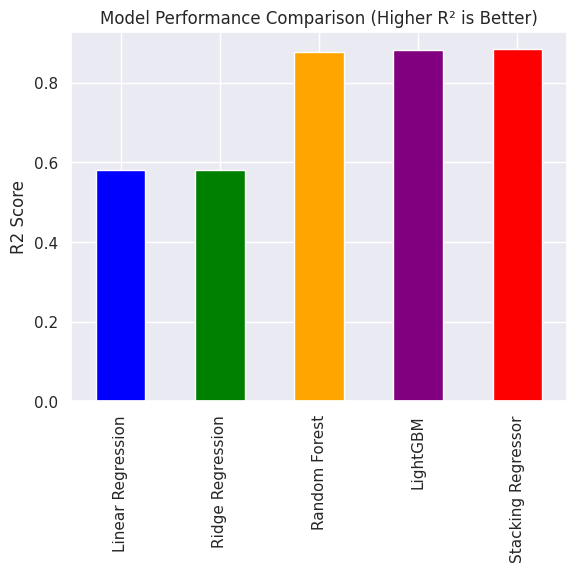

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from sklearn.svm import SVR
from sklearn import metrics
import lightgbm as lgb
import xgboost as xgb
import warnings
warnings.simplefilter("ignore")

# Load dataset
df = pd.read_csv("/content/insurance.csv")

# Remove outliers in 'charges'
df = df[df['charges'] < 50000]

# Encode categorical variables
df = pd.get_dummies(df, columns=['sex', 'smoker', 'region'], drop_first=True)
X = df.drop(columns=['charges'])
y = np.log1p(df['charges'])  # log transform target variable

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# LightGBM with hyperparameter tuning
param_grid = {
    'num_leaves': [31, 50],
    'learning_rate': [0.1, 0.05],
    'n_estimators': [100, 200]
}
lgb_model = lgb.LGBMRegressor(objective='regression', random_state=42)
grid = GridSearchCV(lgb_model, param_grid, cv=3, scoring='r2')
grid.fit(X_train, y_train)
best_lgb = grid.best_estimator_

# Base models for stacking
base_models = [
    ('lr', LinearRegression()),
    ('ridge', Ridge(alpha=1.0)),
    ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('svr', SVR()),
    ('xgb', xgb.XGBRegressor(objective='reg:squarederror', random_state=42))
]

# Stacking model with LightGBM as final estimator
stacking_model = StackingRegressor(
    estimators=base_models,
    final_estimator=best_lgb,
    passthrough=True
)

models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "LightGBM": best_lgb,
    "Stacking Regressor": stacking_model
}

# Train and evaluate models
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = np.expm1(model.predict(X_test))  # convert predictions back
    y_true = np.expm1(y_test)
    r2 = metrics.r2_score(y_true, y_pred)
    mae = metrics.mean_absolute_error(y_true, y_pred)
    mse = metrics.mean_squared_error(y_true, y_pred)
    results[name] = {"R2 Score": r2, "MAE": mae, "MSE": mse}

# Convert results to DataFrame
results_df = pd.DataFrame(results).T
print(results_df.sort_values(by="R2 Score", ascending=False))

# Plot model comparison
results_df["R2 Score"].plot(kind='bar', color=['blue', 'green', 'orange', 'purple', 'red'])
plt.title("Model Performance Comparison (Higher R² is Better)")
plt.ylabel("R2 Score")
plt.show()


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 300
[LightGBM] [Info] Number of data points in the train set: 709, number of used features: 8
[LightGBM] [Info] Start training from score 9.072623
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

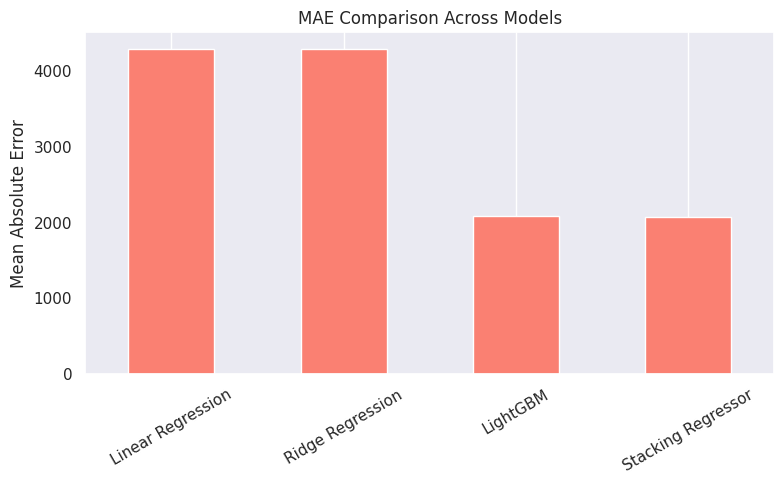

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import StackingRegressor
from sklearn.svm import SVR
from sklearn import metrics
import lightgbm as lgb
import xgboost as xgb
import warnings
warnings.simplefilter("ignore")

# Load dataset
df = pd.read_csv("/content/insurance.csv")

# Remove outliers in 'charges'
df = df[df['charges'] < 50000]

# Encode categorical variables
df = pd.get_dummies(df, columns=['sex', 'smoker', 'region'], drop_first=True)
X = df.drop(columns=['charges'])
y = np.log1p(df['charges'])  # log transform target variable

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# LightGBM with hyperparameter tuning
param_grid = {
    'num_leaves': [31, 50],
    'learning_rate': [0.1, 0.05],
    'n_estimators': [100, 200]
}
lgb_model = lgb.LGBMRegressor(objective='regression', random_state=42)
grid = GridSearchCV(lgb_model, param_grid, cv=3, scoring='r2')
grid.fit(X_train, y_train)
best_lgb = grid.best_estimator_

# Base models for stacking (Random Forest removed)
base_models = [
    ('lr', LinearRegression()),
    ('ridge', Ridge(alpha=1.0)),
    ('svr', SVR()),
    ('xgb', xgb.XGBRegressor(objective='reg:squarederror', random_state=42))
]

# Stacking model with LightGBM as final estimator
stacking_model = StackingRegressor(
    estimators=base_models,
    final_estimator=best_lgb,
    passthrough=True
)

# Define models
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "LightGBM": best_lgb,
    "Stacking Regressor": stacking_model
}

# Train and evaluate models
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = np.expm1(model.predict(X_test))  # inverse transform
    y_true = np.expm1(y_test)
    r2 = metrics.r2_score(y_true, y_pred)
    mae = metrics.mean_absolute_error(y_true, y_pred)
    mse = metrics.mean_squared_error(y_true, y_pred)
    results[name] = {"R2 Score": r2, "MAE": mae, "MSE": mse}

# Convert to DataFrame
results_df = pd.DataFrame(results).T
print(results_df.sort_values(by="R2 Score", ascending=False))



# Plot MAE comparison
plt.figure(figsize=(8, 5))
results_df["MAE"].plot(kind='bar', color='salmon')
plt.title("MAE Comparison Across Models")
plt.ylabel("Mean Absolute Error")
plt.xticks(rotation=30)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np

# ⚠️ Make sure the following are already defined:
# - stacking_model (trained stacking regressor)
# - scaler (StandardScaler used on training data)
# - X.columns (from the training dataset to maintain column order)

# New raw input: age, sex (1=male), bmi, children, smoker (1=yes), region (0=northeast, 1=northwest, 2=southeast, 3=southwest)
raw_input = (31, 1, 25.74, 0, 1, 2)  # 6 values

# Manually apply one-hot encoding like training data
# Columns: age, bmi, children, sex_male, smoker_yes, region_northwest, region_southeast, region_southwest
def preprocess_input(data_tuple):
    age, sex, bmi, children, smoker, region = data_tuple

    sex_male = sex
    smoker_yes = smoker
    region_northwest = 1 if region == 1 else 0
    region_southeast = 1 if region == 2 else 0
    region_southwest = 1 if region == 3 else 0

    input_processed = np.array([
        age, bmi, children, sex_male,
        smoker_yes, region_northwest,
        region_southeast, region_southwest
    ]).reshape(1, -1)

    return scaler.transform(input_processed)

# Preprocess and predict
processed_input = preprocess_input(raw_input)
predicted_log_cost = stacking_model.predict(processed_input)
predicted_cost = np.expm1(predicted_log_cost[0])

print(" Predicted Insurance Cost using Stacking Regressor: USD", round(predicted_cost, 2))


 Predicted Insurance Cost using Stacking Regressor: USD 17484.46


KMeans + lightGBM

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import r2_score, mean_squared_error
from lightgbm import LGBMRegressor
from sklearn.preprocessing import StandardScaler

In [ ]:
# loading the data from csv file to a Pandas DataFrame
insurance_dataset = pd.read_csv('/content/insurance.csv')

In [ ]:
insurance_dataset.replace({
    'sex': {'male': 0, 'female': 1},
    'smoker': {'yes': 0, 'no': 1},
    'region': {'southeast': 0, 'southwest': 1, 'northeast': 2, 'northwest': 3}
}, inplace=True)


In [ ]:
# Splitting features and target
X = insurance_dataset.drop(columns='charges', axis=1)
y = insurance_dataset['charges']

# Feature Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42)


In [ ]:
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels_train = kmeans.fit_predict(X_train)

In [ ]:
cluster_models = {}
for cluster in range(n_clusters):
    cluster_indices = (cluster_labels_train == cluster)
    X_cluster = X_train[cluster_indices]
    y_cluster = y_train[cluster_indices]

    model = LGBMRegressor(n_estimators=100, random_state=42)
    model.fit(X_cluster, y_cluster)
    cluster_models[cluster] = model

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 122
[LightGBM] [Info] Number of data points in the train set: 220, number of used features: 5
[LightGBM] [Info] Start training from score 31767.008372
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

In [ ]:
cluster_labels_test = kmeans.predict(X_test)
y_pred = np.zeros(len(X_test))

for cluster in range(n_clusters):
    indices = (cluster_labels_test == cluster)
    if np.any(indices):
        y_pred[indices] = cluster_models[cluster].predict(X_test[indices])


In [ ]:
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print("📈 Hybrid KMeans + LightGBM Results")
print("✅ R2 Score :", r2)
print("✅ Mean Squared Error :", mse)

📈 Hybrid KMeans + LightGBM Results
✅ R2 Score : 0.857977138539576
✅ Mean Squared Error : 22048869.084562708


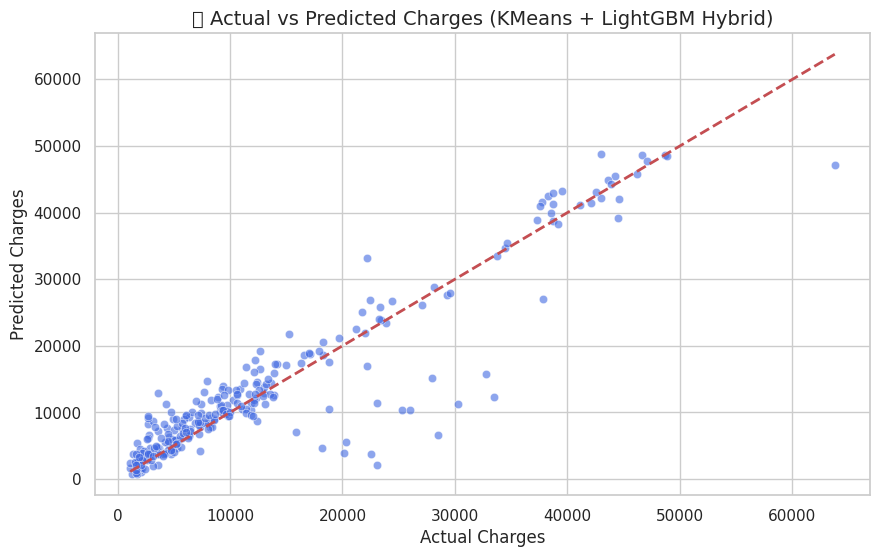

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set(style="whitegrid")

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred, color='royalblue', alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
plt.xlabel("Actual Charges", fontsize=12)
plt.ylabel("Predicted Charges", fontsize=12)
plt.title("📉 Actual vs Predicted Charges (KMeans + LightGBM Hybrid)", fontsize=14)
plt.show()


OPTIMIZE THE NUMBER OF CLUSTERS HYBRID KMEANS + LIGHTGBM

Best number of clusters based on silhouette score: 3
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
📈 Hybrid KMeans + LightGBM Results
✅ R2 Score : 0.873323431564579
✅ Mean Squared Error : 19666376.559329946
📈 Hybrid KMeans + LightGBM Results
✅ R2 Score : 0.873323431564579
✅ Mean Squared Error : 19666376.559329946
✅ Mean Absolute Error : 2200.4556362519756


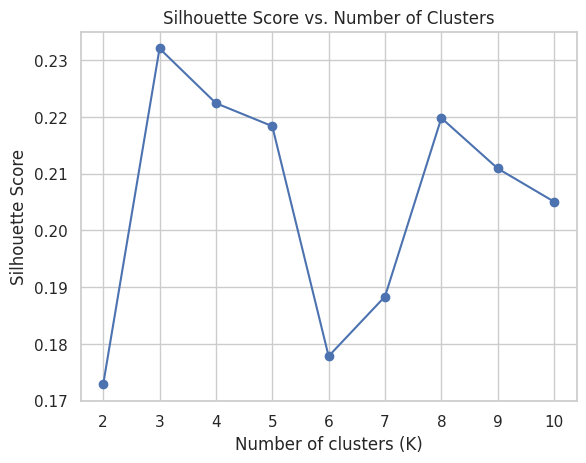

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from sklearn.svm import SVR
from sklearn import metrics
import lightgbm as lgb
import xgboost as xgb
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import warnings
warnings.simplefilter("ignore")

# Load dataset
df = pd.read_csv("/content/insurance.csv")
df = pd.get_dummies(df, columns=['sex', 'smoker', 'region'], drop_first=True)

# Log transform the target
df['charges'] = np.log1p(df['charges'])
X = df.drop(columns='charges')
y = df['charges']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Find optimal number of clusters using Silhouette Score
scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, cluster_labels)
    scores.append((k, score))

best_k = max(scores, key=lambda x: x[1])[0]
print(f"Best number of clusters based on silhouette score: {best_k}")

# Apply KMeans with best_k and add cluster label to data
kmeans = KMeans(n_clusters=best_k, random_state=42)
df['cluster'] = kmeans.fit_predict(X_scaled)

# Prepare final data
X = df.drop(columns='charges')
y = df['charges']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train LightGBM
lgb_model = lgb.LGBMRegressor(random_state=42)
lgb_model.fit(X_train, y_train)

# Predict and evaluate
y_pred = np.expm1(lgb_model.predict(X_test))
y_true = np.expm1(y_test)

r2 = metrics.r2_score(y_true, y_pred)
mse = metrics.mean_squared_error(y_true, y_pred)

print("\U0001F4C8 Hybrid KMeans + LightGBM Results")
print("\u2705 R2 Score :", r2)
print("\u2705 Mean Squared Error :", mse)
mae = metrics.mean_absolute_error(y_true, y_pred)

print("\U0001F4C8 Hybrid KMeans + LightGBM Results")
print("\u2705 R2 Score :", r2)
print("\u2705 Mean Squared Error :", mse)
print("\u2705 Mean Absolute Error :", mae)


# Plot silhouette scores
k_vals, silhouette_vals = zip(*scores)
plt.plot(k_vals, silhouette_vals, marker='o')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.show()


deep hyperparameter tuning

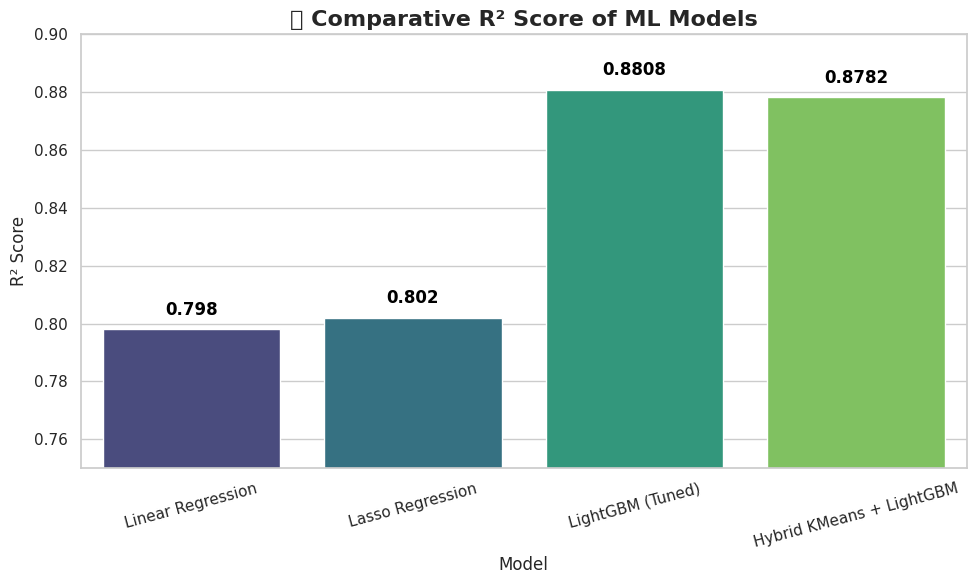

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Sample model names and their corresponding R² scores
model_results = pd.DataFrame({
    'Model': ['Linear Regression', 'Lasso Regression', 'LightGBM (Tuned)', 'Hybrid KMeans + LightGBM'],
    'R2 Score': [0.798, 0.802, 0.8808, 0.8782]
})

# Set the visual theme
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Create barplot
barplot = sns.barplot(
    x='Model', y='R2 Score', data=model_results,
    palette='viridis'
)

# Annotate bars
for index, row in model_results.iterrows():
    barplot.text(index, row['R2 Score'] + 0.005, round(row['R2 Score'], 4),
                 color='black', ha="center", fontsize=12, fontweight='bold')

# Add titles and labels
plt.title('🔍 Comparative R² Score of ML Models', fontsize=16, fontweight='bold')
plt.ylabel('R² Score', fontsize=12)
plt.xlabel('Model', fontsize=12)
plt.ylim(0.75, 0.9)
plt.xticks(rotation=15)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, r2_score, mean_squared_error
import lightgbm as lgb
import optuna
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter("ignore")

In [ ]:
# Load dataset
df = pd.read_csv("/content/insurance.csv")
df = pd.get_dummies(df, columns=['sex', 'smoker', 'region'], drop_first=True)


In [ ]:
!pip install lightgbm optuna


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 22.6 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, r2_score, mean_squared_error
import lightgbm as lgb
import optuna
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter("ignore")


In [ ]:
df = pd.read_csv("/content/insurance.csv")
df = pd.get_dummies(df, columns=['sex', 'smoker', 'region'], drop_first=True)

In [ ]:
df['charges'] = np.log1p(df['charges'])
X = df.drop(columns='charges')
y = df['charges']

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, cluster_labels)
    scores.append((k, score))

best_k = max(scores, key=lambda x: x[1])[0]

In [ ]:
# Apply KMeans with best_k and add cluster label to data
kmeans = KMeans(n_clusters=best_k, random_state=42)
df['cluster'] = kmeans.fit_predict(X_scaled)

In [ ]:
# Final data split
X = df.drop(columns='charges')
y = df['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
def objective(trial):
    params = {
        'learning_rate': trial.suggest_float("learning_rate", 0.02, 0.1),
        'max_depth': trial.suggest_int("max_depth", 4, 10),
        'n_estimators': trial.suggest_int("n_estimators", 500, 1000),
        'num_leaves': trial.suggest_int("num_leaves", 31, 70),
        'min_child_samples': trial.suggest_int("min_child_samples", 20, 80),
        'subsample': trial.suggest_float("subsample", 0.6, 1.0),
        'colsample_bytree': trial.suggest_float("colsample_bytree", 0.6, 1.0),
        'reg_alpha': trial.suggest_float("reg_alpha", 0.0, 1.0),
        'reg_lambda': trial.suggest_float("reg_lambda", 0.0, 1.0),
        'random_state': 42
    }
    model = lgb.LGBMRegressor(**params)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    return r2_score(y_test, preds)
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=150)


[I 2025-04-10 07:16:04,381] A new study created in memory with name: no-name-447ab0f4-a913-4e7a-b2d1-ba55297c142b


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:05,126] Trial 0 finished with value: 0.8267010052033589 and parameters: {'learning_rate': 0.06188439769905771, 'max_depth': 10, 'n_estimators': 884, 'num_leaves': 36, 'min_child_samples': 30, 'subsample': 0.6271753063106336, 'colsample_bytree': 0.8466782412701584, 'reg_alpha': 0.22995477170544532, 'reg_lambda': 0.7359430476125862}. Best is trial 0 with value: 0.8267010052033589.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:05,441] Trial 1 finished with value: 0.8496050250374725 and parameters: {'learning_rate': 0.0351290153445131, 'max_depth': 6, 'n_estimators': 692, 'num_leaves': 43, 'min_child_samples': 23, 'subsample': 0.9025244428768181, 'colsample_bytree': 0.7705987527867163, 'reg_alpha': 0.8889983450926301, 'reg_lambda': 0.5638186074270727}. Best is trial 1 with value: 0.8496050250374725.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-04-10 07:16:05,873] Trial 2 finished with value: 0.8432009880163042 and parameters: {'learning_rate': 0.09294792211565207, 'max_depth': 6, 'n_estimators': 972, 'num_leaves': 60, 'min_child_samples': 52, 'subsample': 0.638150788811373, 'colsample_bytree': 0.6506757869036757, 'reg_alpha': 0.2643043710658004, 'reg_lambda': 0.4956508941456782}. Best is trial 1 with value: 0.8496050250374725.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:06,572] Trial 3 finished with value: 0.8566063474962282 and parameters: {'learning_rate': 0.02278011898183726, 'max_depth': 5, 'n_estimators': 840, 'num_leaves': 38, 'min_child_samples': 31, 'subsample': 0.7895244237202366, 'colsample_bytree': 0.6147594804552131, 'reg_alpha': 0.5816719820382156, 'reg_lambda': 0.4393032716037415}. Best is trial 3 with value: 0.8566063474962282.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:06,812] Trial 4 finished with value: 0.8544506371326233 and parameters: {'learning_rate': 0.09566584437031163, 'max_depth': 5, 'n_estimators': 619, 'num_leaves': 58, 'min_child_samples': 64, 'subsample': 0.9681342903133858, 'colsample_bytree': 0.6154534102663202, 'reg_alpha': 0.7238532777808077, 'reg_lambda': 0.3688345765365757}. Best is trial 3 with value: 0.8566063474962282.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:07,293] Trial 5 finished with value: 0.855856916892355 and parameters: {'learning_rate': 0.022214894553578512, 'max_depth': 6, 'n_estimators': 962, 'num_leaves': 69, 'min_child_samples': 51, 'subsample': 0.7512891034053992, 'colsample_bytree': 0.9961334638000678, 'reg_alpha': 0.3549440206979019, 'reg_lambda': 0.8962029641926267}. Best is trial 3 with value: 0.8566063474962282.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:07,557] Trial 6 finished with value: 0.8598972456300769 and parameters: {'learning_rate': 0.02205439613367145, 'max_depth': 6, 'n_estimators': 509, 'num_leaves': 48, 'min_child_samples': 46, 'subsample': 0.8482346866886369, 'colsample_bytree': 0.9073099173812522, 'reg_alpha': 0.544173657793974, 'reg_lambda': 0.4128809685537428}. Best is trial 6 with value: 0.8598972456300769.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:08,059] Trial 7 finished with value: 0.8560933750541055 and parameters: {'learning_rate': 0.02290290633836735, 'max_depth': 10, 'n_estimators': 984, 'num_leaves': 70, 'min_child_samples': 51, 'subsample': 0.6560363250618916, 'colsample_bytree': 0.7351428235263747, 'reg_alpha': 0.6194304876051713, 'reg_lambda': 0.559979877714623}. Best is trial 6 with value: 0.8598972456300769.
[I 2025-04-10 07:16:08,191] Trial 8 finished with value: 0.8518059064309238 and parameters: {'learning_rate': 0.08127791103169575, 'max_depth': 4, 'n_estimators': 631, 'num_leaves': 68, 'min_child_samples': 24, 'subsample': 0.8411493341221644, 'colsample_bytree': 0.6067503592782346, 'reg_alpha': 0.9436857665633621, 'reg_lambda': 0.36382109944460606}. Best is trial 6 with value: 0.8598972456300769.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000182 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:08,420] Trial 9 finished with value: 0.8478197220116035 and parameters: {'learning_rate': 0.06372061098997271, 'max_depth': 6, 'n_estimators': 547, 'num_leaves': 44, 'min_child_samples': 24, 'subsample': 0.7953646461426871, 'colsample_bytree': 0.9741039579884555, 'reg_alpha': 0.9220279138011762, 'reg_lambda': 0.8119936514673405}. Best is trial 6 with value: 0.8598972456300769.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:08,849] Trial 10 finished with value: 0.8550385081541474 and parameters: {'learning_rate': 0.04343156784774506, 'max_depth': 8, 'n_estimators': 759, 'num_leaves': 52, 'min_child_samples': 77, 'subsample': 0.9989442357703512, 'colsample_bytree': 0.8846551244484939, 'reg_alpha': 0.014793589682598696, 'reg_lambda': 0.010532358522593599}. Best is trial 6 with value: 0.8598972456300769.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:09,451] Trial 11 finished with value: 0.8462023748715628 and parameters: {'learning_rate': 0.04198149471960411, 'max_depth': 8, 'n_estimators': 822, 'num_leaves': 31, 'min_child_samples': 37, 'subsample': 0.7431837177142682, 'colsample_bytree': 0.9217657630308591, 'reg_alpha': 0.5012522968747053, 'reg_lambda': 0.1840141988154741}. Best is trial 6 with value: 0.8598972456300769.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:09,800] Trial 12 finished with value: 0.8583087546817989 and parameters: {'learning_rate': 0.033319550021622915, 'max_depth': 4, 'n_estimators': 830, 'num_leaves': 42, 'min_child_samples': 39, 'subsample': 0.8659203926421895, 'colsample_bytree': 0.7056322149873158, 'reg_alpha': 0.6806292983195608, 'reg_lambda': 0.27878629177992637}. Best is trial 6 with value: 0.8598972456300769.
[I 2025-04-10 07:16:10,080] Trial 13 finished with value: 0.8623351982903096 and parameters: {'learning_rate': 0.034289067693960444, 'max_depth': 4, 'n_estimators': 517, 'num_leaves': 49, 'min_child_samples': 37, 'subsample': 0.8636944162300849, 'colsample_bytree': 0.7119837501099887, 'reg_alpha': 0.724023255135519, 'reg_lambda': 0.20720564431209665}. Best is trial 13 with value: 0.8623351982903096.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:10,429] Trial 14 finished with value: 0.8537763320652796 and parameters: {'learning_rate': 0.0507616595781875, 'max_depth': 8, 'n_estimators': 524, 'num_leaves': 50, 'min_child_samples': 43, 'subsample': 0.9203362046056331, 'colsample_bytree': 0.826977499778375, 'reg_alpha': 0.8070219846274075, 'reg_lambda': 0.11903359288462101}. Best is trial 13 with value: 0.8623351982903096.
[I 2025-04-10 07:16:10,645] Trial 15 finished with value: 0.8625222035738023 and parameters: {'learning_rate': 0.032763866245156315, 'max_depth': 4, 'n_estimators': 507, 'num_leaves': 49, 'min_child_samples': 64, 'subsample': 0.8645260537167446, 'colsample_bytree': 0.6932117829660216, 'reg_alpha': 0.4432521536638575, 'reg_lambda': 0.23813306987294292}. Best is trial 15 with value: 0.8625222035738023.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:10,943] Trial 16 finished with value: 0.8595125944019743 and parameters: {'learning_rate': 0.055665873338287354, 'max_depth': 4, 'n_estimators': 581, 'num_leaves': 56, 'min_child_samples': 62, 'subsample': 0.9218713264678047, 'colsample_bytree': 0.7017495641213859, 'reg_alpha': 0.38593847543035104, 'reg_lambda': 0.19302348622031695}. Best is trial 15 with value: 0.8625222035738023.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:11,239] Trial 17 finished with value: 0.8573559640479175 and parameters: {'learning_rate': 0.0755612587984511, 'max_depth': 5, 'n_estimators': 689, 'num_leaves': 54, 'min_child_samples': 65, 'subsample': 0.7021086238494616, 'colsample_bytree': 0.7719492176356254, 'reg_alpha': 0.7896148825718186, 'reg_lambda': 0.0013906053568988885}. Best is trial 15 with value: 0.8625222035738023.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:11,691] Trial 18 finished with value: 0.86358731060321 and parameters: {'learning_rate': 0.03453438392486562, 'max_depth': 4, 'n_estimators': 590, 'num_leaves': 63, 'min_child_samples': 78, 'subsample': 0.885508458394217, 'colsample_bytree': 0.674713217430578, 'reg_alpha': 0.4121710630462209, 'reg_lambda': 0.26715939713266157}. Best is trial 18 with value: 0.86358731060321.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:11,986] Trial 19 finished with value: 0.8582701107539681 and parameters: {'learning_rate': 0.04673255360243836, 'max_depth': 7, 'n_estimators': 591, 'num_leaves': 64, 'min_child_samples': 80, 'subsample': 0.9618868608194238, 'colsample_bytree': 0.6691364474886525, 'reg_alpha': 0.11845738440697984, 'reg_lambda': 0.6622622791116909}. Best is trial 18 with value: 0.86358731060321.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:12,425] Trial 20 finished with value: 0.8598777032333089 and parameters: {'learning_rate': 0.03495542772761751, 'max_depth': 5, 'n_estimators': 682, 'num_leaves': 63, 'min_child_samples': 72, 'subsample': 0.8224967835475059, 'colsample_bytree': 0.6631635969693148, 'reg_alpha': 0.4041680620383322, 'reg_lambda': 0.3074112181000159}. Best is trial 18 with value: 0.86358731060321.
[I 2025-04-10 07:16:12,739] Trial 21 finished with value: 0.8634733854626644 and parameters: {'learning_rate': 0.030956692647807833, 'max_depth': 4, 'n_estimators': 556, 'num_leaves': 48, 'min_child_samples': 71, 'subsample': 0.8769790016231682, 'colsample_bytree': 0.7165380799854821, 'reg_alpha': 0.48050970414586364, 'reg_lambda': 0.13086199830411072}. Best is trial 18 with value: 0.86358731060321.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:12,942] Trial 22 finished with value: 0.863711566830578 and parameters: {'learning_rate': 0.02983745703246214, 'max_depth': 4, 'n_estimators': 579, 'num_leaves': 47, 'min_child_samples': 71, 'subsample': 0.8985022719969793, 'colsample_bytree': 0.7486254841423793, 'reg_alpha': 0.4414411559432453, 'reg_lambda': 0.09463107799931195}. Best is trial 22 with value: 0.863711566830578.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:13,224] Trial 23 finished with value: 0.8627041510708146 and parameters: {'learning_rate': 0.028893778766314323, 'max_depth': 5, 'n_estimators': 569, 'num_leaves': 46, 'min_child_samples': 72, 'subsample': 0.8917544783066191, 'colsample_bytree': 0.7436186759496877, 'reg_alpha': 0.2922215481637322, 'reg_lambda': 0.11415196594392552}. Best is trial 22 with value: 0.863711566830578.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:13,623] Trial 24 finished with value: 0.8626969276166592 and parameters: {'learning_rate': 0.04129477435865948, 'max_depth': 4, 'n_estimators': 649, 'num_leaves': 40, 'min_child_samples': 72, 'subsample': 0.9480054699446553, 'colsample_bytree': 0.7921929166070081, 'reg_alpha': 0.4820454654766558, 'reg_lambda': 0.08643349725344718}. Best is trial 22 with value: 0.863711566830578.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:13,940] Trial 25 finished with value: 0.8629001713445743 and parameters: {'learning_rate': 0.027446571140422003, 'max_depth': 5, 'n_estimators': 600, 'num_leaves': 52, 'min_child_samples': 69, 'subsample': 0.8935533412374619, 'colsample_bytree': 0.7437072679069392, 'reg_alpha': 0.17636585720523945, 'reg_lambda': 0.084106936726938}. Best is trial 22 with value: 0.863711566830578.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:14,395] Trial 26 finished with value: 0.8543148680930219 and parameters: {'learning_rate': 0.05077876376789818, 'max_depth': 9, 'n_estimators': 738, 'num_leaves': 46, 'min_child_samples': 57, 'subsample': 0.9962094645247638, 'colsample_bytree': 0.8067738813872856, 'reg_alpha': 0.34975116281608837, 'reg_lambda': 0.9934214033464868}. Best is trial 22 with value: 0.863711566830578.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:14,644] Trial 27 finished with value: 0.8570244210248668 and parameters: {'learning_rate': 0.07075143186327754, 'max_depth': 7, 'n_estimators': 649, 'num_leaves': 61, 'min_child_samples': 77, 'subsample': 0.8177366970899688, 'colsample_bytree': 0.6419994962621314, 'reg_alpha': 0.629103276417963, 'reg_lambda': 0.1435859801610464}. Best is trial 22 with value: 0.863711566830578.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:14,897] Trial 28 finished with value: 0.8618342699666475 and parameters: {'learning_rate': 0.039113631217280134, 'max_depth': 4, 'n_estimators': 739, 'num_leaves': 55, 'min_child_samples': 79, 'subsample': 0.9398935597318936, 'colsample_bytree': 0.7272252520696216, 'reg_alpha': 0.5176435215496765, 'reg_lambda': 0.2923766375055902}. Best is trial 22 with value: 0.863711566830578.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:15,093] Trial 29 finished with value: 0.855528545563718 and parameters: {'learning_rate': 0.05864536146959183, 'max_depth': 5, 'n_estimators': 550, 'num_leaves': 31, 'min_child_samples': 59, 'subsample': 0.7593142762744007, 'colsample_bytree': 0.679394369000077, 'reg_alpha': 0.3100108543033141, 'reg_lambda': 0.066261185935071}. Best is trial 22 with value: 0.863711566830578.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:15,322] Trial 30 finished with value: 0.8582969615558015 and parameters: {'learning_rate': 0.04711712667215522, 'max_depth': 7, 'n_estimators': 564, 'num_leaves': 34, 'min_child_samples': 70, 'subsample': 0.8833333552785927, 'colsample_bytree': 0.8640278493881401, 'reg_alpha': 0.16425031774662713, 'reg_lambda': 0.2478351862519047}. Best is trial 22 with value: 0.863711566830578.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:15,525] Trial 31 finished with value: 0.8638881831729636 and parameters: {'learning_rate': 0.027249829569364534, 'max_depth': 4, 'n_estimators': 607, 'num_leaves': 53, 'min_child_samples': 68, 'subsample': 0.9081709411058441, 'colsample_bytree': 0.7578270536788267, 'reg_alpha': 0.1839750835083646, 'reg_lambda': 0.05919240538746795}. Best is trial 31 with value: 0.8638881831729636.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:15,744] Trial 32 finished with value: 0.8635779719564988 and parameters: {'learning_rate': 0.028878758520380455, 'max_depth': 4, 'n_estimators': 603, 'num_leaves': 65, 'min_child_samples': 68, 'subsample': 0.9237742668425972, 'colsample_bytree': 0.7705108255856922, 'reg_alpha': 0.048429054283092576, 'reg_lambda': 0.037661361858746856}. Best is trial 31 with value: 0.8638881831729636.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:15,970] Trial 33 finished with value: 0.860816112001978 and parameters: {'learning_rate': 0.02778965306929916, 'max_depth': 4, 'n_estimators': 655, 'num_leaves': 67, 'min_child_samples': 56, 'subsample': 0.9135498463604756, 'colsample_bytree': 0.7670948472772677, 'reg_alpha': 0.017650572551945853, 'reg_lambda': 0.02336993734695078}. Best is trial 31 with value: 0.8638881831729636.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:16,179] Trial 34 finished with value: 0.8612672452435829 and parameters: {'learning_rate': 0.03672700527249957, 'max_depth': 5, 'n_estimators': 614, 'num_leaves': 63, 'min_child_samples': 67, 'subsample': 0.9392732507976135, 'colsample_bytree': 0.8219737307295062, 'reg_alpha': 0.11533125432500177, 'reg_lambda': 0.04525665004972336}. Best is trial 31 with value: 0.8638881831729636.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:16,443] Trial 35 finished with value: 0.8640875208762214 and parameters: {'learning_rate': 0.02682019179670697, 'max_depth': 4, 'n_estimators': 714, 'num_leaves': 66, 'min_child_samples': 75, 'subsample': 0.976459538084112, 'colsample_bytree': 0.7701002337722073, 'reg_alpha': 0.21108174703911878, 'reg_lambda': 0.15353692911610445}. Best is trial 35 with value: 0.8640875208762214.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:16,734] Trial 36 finished with value: 0.8621842590127977 and parameters: {'learning_rate': 0.02512543878892378, 'max_depth': 5, 'n_estimators': 769, 'num_leaves': 60, 'min_child_samples': 75, 'subsample': 0.9766792474936812, 'colsample_bytree': 0.7854184486984527, 'reg_alpha': 0.22532002008362573, 'reg_lambda': 0.15875433212692722}. Best is trial 35 with value: 0.8640875208762214.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:17,064] Trial 37 finished with value: 0.8607691782242852 and parameters: {'learning_rate': 0.020757088924484763, 'max_depth': 5, 'n_estimators': 922, 'num_leaves': 67, 'min_child_samples': 75, 'subsample': 0.97265195913906, 'colsample_bytree': 0.6331849219463865, 'reg_alpha': 0.23072440909965788, 'reg_lambda': 0.3321165907981436}. Best is trial 35 with value: 0.8640875208762214.
[I 2025-04-10 07:16:17,256] Trial 38 finished with value: 0.8586649944071708 and parameters: {'learning_rate': 0.03878042665189335, 'max_depth': 6, 'n_estimators': 722, 'num_leaves': 56, 'min_child_samples': 75, 'subsample': 0.8346811271686857, 'colsample_bytree': 0.7484510158943979, 'reg_alpha': 0.24367258849155324, 'reg_lambda': 0.4806080629351053}. Best is trial 35 with value: 0.8640875208762214.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2025-04-10 07:16:17,428] Trial 39 finished with value: 0.8635658958033735 and parameters: {'learning_rate': 0.020582755223818458, 'max_depth': 4, 'n_estimators': 710, 'num_leaves': 58, 'min_child_samples': 60, 'subsample': 0.9573560375866188, 'colsample_bytree': 0.8440944374155507, 'reg_alpha': 0.34913862506129534, 'reg_lambda': 0.4023304352025797}. Best is trial 35 with value: 0.8640875208762214.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:17,635] Trial 40 finished with value: 0.8592907580884843 and parameters: {'learning_rate': 0.025397662960762447, 'max_depth': 6, 'n_estimators': 870, 'num_leaves': 59, 'min_child_samples': 80, 'subsample': 0.9044360489990185, 'colsample_bytree': 0.684202952156415, 'reg_alpha': 0.09480135829312829, 'reg_lambda': 0.2392495903365093}. Best is trial 35 with value: 0.8640875208762214.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:17,822] Trial 41 finished with value: 0.8620954033633794 and parameters: {'learning_rate': 0.029640147184112817, 'max_depth': 4, 'n_estimators': 797, 'num_leaves': 65, 'min_child_samples': 67, 'subsample': 0.9252270419887809, 'colsample_bytree': 0.7611351400902875, 'reg_alpha': 0.08494866732877221, 'reg_lambda': 0.07032659453162923}. Best is trial 35 with value: 0.8640875208762214.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:17,999] Trial 42 finished with value: 0.8575585256577388 and parameters: {'learning_rate': 0.08734533091679622, 'max_depth': 4, 'n_estimators': 627, 'num_leaves': 66, 'min_child_samples': 68, 'subsample': 0.9317782302817332, 'colsample_bytree': 0.8056048769390081, 'reg_alpha': 0.05032050328825735, 'reg_lambda': 0.15953211289289723}. Best is trial 35 with value: 0.8640875208762214.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:18,142] Trial 43 finished with value: 0.8641757305463325 and parameters: {'learning_rate': 0.025431215764411652, 'max_depth': 4, 'n_estimators': 604, 'num_leaves': 70, 'min_child_samples': 74, 'subsample': 0.9814997002963088, 'colsample_bytree': 0.772081808361007, 'reg_alpha': 0.18471329919890028, 'reg_lambda': 0.036914391171794514}. Best is trial 43 with value: 0.8641757305463325.
[I 2025-04-10 07:16:18,312] Trial 44 finished with value: 0.8621834926307048 and parameters: {'learning_rate': 0.023663096014678843, 'max_depth': 5, 'n_estimators': 675, 'num_leaves': 70, 'min_child_samples': 74, 'subsample': 0.9843517943486408, 'colsample_bytree': 0.7306994225077922, 'reg_alpha': 0.2924102962854833, 'reg_lambda': 0.1156997492658292}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000193 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:18,460] Trial 45 finished with value: 0.8626137679510001 and parameters: {'learning_rate': 0.03679475688131468, 'max_depth': 4, 'n_estimators': 534, 'num_leaves': 69, 'min_child_samples': 78, 'subsample': 0.9590177571385733, 'colsample_bytree': 0.7800808784237454, 'reg_alpha': 0.18247617117352902, 'reg_lambda': 0.6479183130706643}. Best is trial 43 with value: 0.8641757305463325.
[I 2025-04-10 07:16:18,602] Trial 46 finished with value: 0.8611954059146771 and parameters: {'learning_rate': 0.03183362667730931, 'max_depth': 4, 'n_estimators': 586, 'num_leaves': 62, 'min_child_samples': 47, 'subsample': 0.7769428382101524, 'colsample_bytree': 0.8244698032087183, 'reg_alpha': 0.43015958658771997, 'reg_lambda': 0.1975466201392089}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:18,802] Trial 47 finished with value: 0.8524146453874287 and parameters: {'learning_rate': 0.02545205431990477, 'max_depth': 5, 'n_estimators': 632, 'num_leaves': 68, 'min_child_samples': 20, 'subsample': 0.8528793337451576, 'colsample_bytree': 0.7609768936907038, 'reg_alpha': 0.5692553272994476, 'reg_lambda': 0.002806389382934968}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:19,022] Trial 48 finished with value: 0.8578092423256215 and parameters: {'learning_rate': 0.020235531163423918, 'max_depth': 10, 'n_estimators': 668, 'num_leaves': 52, 'min_child_samples': 54, 'subsample': 0.6213419618072087, 'colsample_bytree': 0.7203998625811954, 'reg_alpha': 0.19978410397219065, 'reg_lambda': 0.08519430447338094}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:19,195] Trial 49 finished with value: 0.8607093214606789 and parameters: {'learning_rate': 0.04366385906659315, 'max_depth': 4, 'n_estimators': 711, 'num_leaves': 42, 'min_child_samples': 63, 'subsample': 0.9988381070801367, 'colsample_bytree': 0.8007621192355209, 'reg_alpha': 0.14868951214751713, 'reg_lambda': 0.3525808488057238}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:19,415] Trial 50 finished with value: 0.8311185004274932 and parameters: {'learning_rate': 0.09921446524059852, 'max_depth': 9, 'n_estimators': 538, 'num_leaves': 70, 'min_child_samples': 30, 'subsample': 0.9045074962860463, 'colsample_bytree': 0.8522733546582447, 'reg_alpha': 0.2923293838287607, 'reg_lambda': 0.2571443980323658}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:19,577] Trial 51 finished with value: 0.86361762836134 and parameters: {'learning_rate': 0.03010528849209904, 'max_depth': 4, 'n_estimators': 607, 'num_leaves': 65, 'min_child_samples': 74, 'subsample': 0.9478017338859129, 'colsample_bytree': 0.7509045006416012, 'reg_alpha': 0.0755664011596697, 'reg_lambda': 0.03392957723414444}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:19,732] Trial 52 finished with value: 0.862742993974657 and parameters: {'learning_rate': 0.033840350553605465, 'max_depth': 4, 'n_estimators': 616, 'num_leaves': 65, 'min_child_samples': 77, 'subsample': 0.9811170846600704, 'colsample_bytree': 0.7522326292411186, 'reg_alpha': 0.14271956048808285, 'reg_lambda': 0.044037720984900885}. Best is trial 43 with value: 0.8641757305463325.
[I 2025-04-10 07:16:19,865] Trial 53 finished with value: 0.8609880604910248 and parameters: {'learning_rate': 0.02571303103081088, 'max_depth': 4, 'n_estimators': 572, 'num_leaves': 45, 'min_child_samples': 74, 'subsample': 0.9479517581056139, 'colsample_bytree': 0.6000879692455879, 'reg_alpha': 0.2527436797432263, 'reg_lambda': 0.16983835958061042}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:20,033] Trial 54 finished with value: 0.8629674984295469 and parameters: {'learning_rate': 0.03094827343724189, 'max_depth': 4, 'n_estimators': 583, 'num_leaves': 68, 'min_child_samples': 66, 'subsample': 0.967801313300453, 'colsample_bytree': 0.7002730341121114, 'reg_alpha': 0.20280849624082256, 'reg_lambda': 0.2124174188422427}. Best is trial 43 with value: 0.8641757305463325.
[I 2025-04-10 07:16:20,171] Trial 55 finished with value: 0.863703651298255 and parameters: {'learning_rate': 0.023695265144529323, 'max_depth': 5, 'n_estimators': 502, 'num_leaves': 62, 'min_child_samples': 73, 'subsample': 0.8738950899014387, 'colsample_bytree': 0.7339358573308026, 'reg_alpha': 0.05545756031900238, 'reg_lambda': 0.11232029315854963}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:20,313] Trial 56 finished with value: 0.8584580771297541 and parameters: {'learning_rate': 0.06510166516360084, 'max_depth': 5, 'n_estimators': 503, 'num_leaves': 57, 'min_child_samples': 70, 'subsample': 0.9110525541042447, 'colsample_bytree': 0.7842525563128838, 'reg_alpha': 0.0071938643118909795, 'reg_lambda': 0.11479405597672486}. Best is trial 43 with value: 0.8641757305463325.
[I 2025-04-10 07:16:20,473] Trial 57 finished with value: 0.8623838871622012 and parameters: {'learning_rate': 0.022746469922857542, 'max_depth': 6, 'n_estimators': 524, 'num_leaves': 54, 'min_child_samples': 73, 'subsample': 0.8681042679231465, 'colsample_bytree': 0.7452920468937441, 'reg_alpha': 0.0967771732426731, 'reg_lambda': 0.09577569083224463}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:20,654] Trial 58 finished with value: 0.8606424742656779 and parameters: {'learning_rate': 0.027673981948088424, 'max_depth': 5, 'n_estimators': 639, 'num_leaves': 61, 'min_child_samples': 61, 'subsample': 0.6814038561359297, 'colsample_bytree': 0.7319692916570458, 'reg_alpha': 0.04676057318092032, 'reg_lambda': 0.06214759716059337}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:20,793] Trial 59 finished with value: 0.8631011996665714 and parameters: {'learning_rate': 0.02343308485666406, 'max_depth': 4, 'n_estimators': 549, 'num_leaves': 47, 'min_child_samples': 65, 'subsample': 0.951554646121959, 'colsample_bytree': 0.7119151107045848, 'reg_alpha': 0.06771853399690816, 'reg_lambda': 0.006087020116078812}. Best is trial 43 with value: 0.8641757305463325.
[I 2025-04-10 07:16:20,980] Trial 60 finished with value: 0.8599677942826622 and parameters: {'learning_rate': 0.0386283624369473, 'max_depth': 5, 'n_estimators': 611, 'num_leaves': 67, 'min_child_samples': 76, 'subsample': 0.9350347532851128, 'colsample_bytree': 0.8137956969217474, 'reg_alpha': 0.13593353687045906, 'reg_lambda': 0.8472269397811861}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:21,152] Trial 61 finished with value: 0.8618427596094966 and parameters: {'learning_rate': 0.03192299754578888, 'max_depth': 4, 'n_estimators': 591, 'num_leaves': 63, 'min_child_samples': 71, 'subsample': 0.8871088097932753, 'colsample_bytree': 0.6601495642308226, 'reg_alpha': 0.385105942742359, 'reg_lambda': 0.14572482319963997}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:21,331] Trial 62 finished with value: 0.8624559212832803 and parameters: {'learning_rate': 0.03478623599084095, 'max_depth': 4, 'n_estimators': 665, 'num_leaves': 64, 'min_child_samples': 78, 'subsample': 0.8955870485076692, 'colsample_bytree': 0.7579336846091577, 'reg_alpha': 0.4454551488894259, 'reg_lambda': 0.19630995219033437}. Best is trial 43 with value: 0.8641757305463325.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:21,476] Trial 63 finished with value: 0.8636081004338573 and parameters: {'learning_rate': 0.029381672066508217, 'max_depth': 4, 'n_estimators': 556, 'num_leaves': 66, 'min_child_samples': 80, 'subsample': 0.8512442501065721, 'colsample_bytree': 0.775338171278552, 'reg_alpha': 0.32331696043468217, 'reg_lambda': 0.04727871274099636}. Best is trial 43 with value: 0.8641757305463325.
[I 2025-04-10 07:16:21,624] Trial 64 finished with value: 0.8642323770083578 and parameters: {'learning_rate': 0.026657961564850896, 'max_depth': 4, 'n_estimators': 524, 'num_leaves': 69, 'min_child_samples': 80, 'subsample': 0.8563938079504336, 'colsample_bytree': 0.7907987290598859, 'reg_alpha': 0.3320045407226741, 'reg_lambda': 0.03942057867986923}. Best is trial 64 with value: 0.8642323770083578.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:21,774] Trial 65 finished with value: 0.8629525107088669 and parameters: {'learning_rate': 0.02650160304545385, 'max_depth': 4, 'n_estimators': 523, 'num_leaves': 69, 'min_child_samples': 73, 'subsample': 0.8099657573555564, 'colsample_bytree': 0.9525248704608131, 'reg_alpha': 0.20672721258346088, 'reg_lambda': 0.1009168732131667}. Best is trial 64 with value: 0.8642323770083578.
[I 2025-04-10 07:16:21,923] Trial 66 finished with value: 0.867417203655392 and parameters: {'learning_rate': 0.022601608755615163, 'max_depth': 4, 'n_estimators': 500, 'num_leaves': 51, 'min_child_samples': 69, 'subsample': 0.8728376957784303, 'colsample_bytree': 0.79276185294423, 'reg_alpha': 0.27185729414040305, 'reg_lambda': 0.02500854753509088}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000196 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:22,100] Trial 67 finished with value: 0.8648737897442422 and parameters: {'learning_rate': 0.023473902251839013, 'max_depth': 5, 'n_estimators': 503, 'num_leaves': 51, 'min_child_samples': 70, 'subsample': 0.841540185215023, 'colsample_bytree': 0.7904606536874297, 'reg_alpha': 0.37315668083860143, 'reg_lambda': 0.13013299243160334}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:22,246] Trial 68 finished with value: 0.8651942372284822 and parameters: {'learning_rate': 0.022603558967878207, 'max_depth': 4, 'n_estimators': 534, 'num_leaves': 50, 'min_child_samples': 70, 'subsample': 0.8309322236027694, 'colsample_bytree': 0.8401563899518474, 'reg_alpha': 0.2691357529249781, 'reg_lambda': 0.5441044440543963}. Best is trial 66 with value: 0.867417203655392.
[I 2025-04-10 07:16:22,403] Trial 69 finished with value: 0.8666286323412274 and parameters: {'learning_rate': 0.02023867840444225, 'max_depth': 4, 'n_estimators': 536, 'num_leaves': 50, 'min_child_samples': 69, 'subsample': 0.8303487042945512, 'colsample_bytree': 0.8865160306383761, 'reg_alpha': 0.26326359508760466, 'reg_lambda': 0.5120255193165936}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:22,570] Trial 70 finished with value: 0.8646392465324257 and parameters: {'learning_rate': 0.020286507621575023, 'max_depth': 4, 'n_estimators': 536, 'num_leaves': 50, 'min_child_samples': 63, 'subsample': 0.8314155210646529, 'colsample_bytree': 0.9110094669720884, 'reg_alpha': 0.26586108476189163, 'reg_lambda': 0.6175343518385749}. Best is trial 66 with value: 0.867417203655392.
[I 2025-04-10 07:16:22,714] Trial 71 finished with value: 0.8663076060476059 and parameters: {'learning_rate': 0.02209717745246246, 'max_depth': 4, 'n_estimators': 519, 'num_leaves': 51, 'min_child_samples': 69, 'subsample': 0.8318987126009437, 'colsample_bytree': 0.9009682648606251, 'reg_alpha': 0.26871654203831097, 'reg_lambda': 0.5609352589227985}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:22,878] Trial 72 finished with value: 0.8653747709383082 and parameters: {'learning_rate': 0.020053985049978833, 'max_depth': 4, 'n_estimators': 533, 'num_leaves': 50, 'min_child_samples': 64, 'subsample': 0.8308614951040267, 'colsample_bytree': 0.902761909504207, 'reg_alpha': 0.2719706035505778, 'reg_lambda': 0.5703045980541676}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:23,049] Trial 73 finished with value: 0.8637768356371492 and parameters: {'learning_rate': 0.021789107495598724, 'max_depth': 4, 'n_estimators': 516, 'num_leaves': 51, 'min_child_samples': 64, 'subsample': 0.8328178933735936, 'colsample_bytree': 0.9027549558459752, 'reg_alpha': 0.2750551741035401, 'reg_lambda': 0.5486534702974032}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:23,214] Trial 74 finished with value: 0.8652798178321341 and parameters: {'learning_rate': 0.02027690401211715, 'max_depth': 4, 'n_estimators': 535, 'num_leaves': 49, 'min_child_samples': 62, 'subsample': 0.8017245517618772, 'colsample_bytree': 0.9295394854827562, 'reg_alpha': 0.3389483923566944, 'reg_lambda': 0.6028044063654041}. Best is trial 66 with value: 0.867417203655392.
[I 2025-04-10 07:16:23,380] Trial 75 finished with value: 0.8620114455733964 and parameters: {'learning_rate': 0.021014443796527654, 'max_depth': 5, 'n_estimators': 540, 'num_leaves': 50, 'min_child_samples': 58, 'subsample': 0.7868824565607501, 'colsample_bytree': 0.9190832040280595, 'reg_alpha': 0.3717761618488925, 'reg_lambda': 0.6196981700847789}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:23,568] Trial 76 finished with value: 0.8611488096268467 and parameters: {'learning_rate': 0.022838572280376817, 'max_depth': 5, 'n_estimators': 563, 'num_leaves': 49, 'min_child_samples': 63, 'subsample': 0.8049044339680907, 'colsample_bytree': 0.9378131726294937, 'reg_alpha': 0.259153893542563, 'reg_lambda': 0.7077559904196603}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:23,722] Trial 77 finished with value: 0.8658674186448443 and parameters: {'learning_rate': 0.02049807092015383, 'max_depth': 4, 'n_estimators': 500, 'num_leaves': 51, 'min_child_samples': 61, 'subsample': 0.8220918912334078, 'colsample_bytree': 0.8783136762402217, 'reg_alpha': 0.31499735805638934, 'reg_lambda': 0.5181306035138433}. Best is trial 66 with value: 0.867417203655392.
[I 2025-04-10 07:16:23,870] Trial 78 finished with value: 0.86543919647874 and parameters: {'learning_rate': 0.020003133546344466, 'max_depth': 4, 'n_estimators': 510, 'num_leaves': 48, 'min_child_samples': 61, 'subsample': 0.8236835824092554, 'colsample_bytree': 0.880276986643026, 'reg_alpha': 0.35171462826091443, 'reg_lambda': 0.5195700705494379}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:24,041] Trial 79 finished with value: 0.8653593690674718 and parameters: {'learning_rate': 0.020278464594756417, 'max_depth': 4, 'n_estimators': 511, 'num_leaves': 53, 'min_child_samples': 56, 'subsample': 0.8199802078539378, 'colsample_bytree': 0.8848974373510486, 'reg_alpha': 0.3207213139120323, 'reg_lambda': 0.5274358437147945}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:24,273] Trial 80 finished with value: 0.8590393818398859 and parameters: {'learning_rate': 0.020002197980326226, 'max_depth': 9, 'n_estimators': 513, 'num_leaves': 48, 'min_child_samples': 49, 'subsample': 0.7700596655063112, 'colsample_bytree': 0.8829088263253607, 'reg_alpha': 0.32869559290893124, 'reg_lambda': 0.47615190277236763}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:24,445] Trial 81 finished with value: 0.864120508770869 and parameters: {'learning_rate': 0.02397249310931467, 'max_depth': 4, 'n_estimators': 529, 'num_leaves': 53, 'min_child_samples': 55, 'subsample': 0.8179160453146489, 'colsample_bytree': 0.8875912281223192, 'reg_alpha': 0.4055483717533403, 'reg_lambda': 0.5199179502751134}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:24,632] Trial 82 finished with value: 0.8640873157633765 and parameters: {'learning_rate': 0.02244028200320176, 'max_depth': 4, 'n_estimators': 551, 'num_leaves': 49, 'min_child_samples': 53, 'subsample': 0.7955542826208398, 'colsample_bytree': 0.8736981328418065, 'reg_alpha': 0.30521176683100426, 'reg_lambda': 0.5906966480547511}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:24,795] Trial 83 finished with value: 0.8651224068281955 and parameters: {'learning_rate': 0.022133333222711705, 'max_depth': 4, 'n_estimators': 512, 'num_leaves': 52, 'min_child_samples': 60, 'subsample': 0.734729271773108, 'colsample_bytree': 0.8959060942529904, 'reg_alpha': 0.34505118250245964, 'reg_lambda': 0.4442074706950275}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:24,956] Trial 84 finished with value: 0.8647577850107394 and parameters: {'learning_rate': 0.024648551101045683, 'max_depth': 4, 'n_estimators': 542, 'num_leaves': 47, 'min_child_samples': 57, 'subsample': 0.8220076967045964, 'colsample_bytree': 0.8429812208088041, 'reg_alpha': 0.27813722804586277, 'reg_lambda': 0.531560825223892}. Best is trial 66 with value: 0.867417203655392.
[I 2025-04-10 07:16:25,131] Trial 85 finished with value: 0.8637982064060569 and parameters: {'learning_rate': 0.028258984261673722, 'max_depth': 4, 'n_estimators': 569, 'num_leaves': 54, 'min_child_samples': 61, 'subsample': 0.8097611727972222, 'colsample_bytree': 0.9324089092885579, 'reg_alpha': 0.3072905299473862, 'reg_lambda': 0.5751199016218913}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:25,309] Trial 86 finished with value: 0.8647935215207041 and parameters: {'learning_rate': 0.021960775650406918, 'max_depth': 4, 'n_estimators': 514, 'num_leaves': 45, 'min_child_samples': 65, 'subsample': 0.8435372363642899, 'colsample_bytree': 0.8710320276065879, 'reg_alpha': 0.2312244651892786, 'reg_lambda': 0.5133564976488283}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:25,470] Trial 87 finished with value: 0.8653127992347902 and parameters: {'learning_rate': 0.020160806682667873, 'max_depth': 4, 'n_estimators': 529, 'num_leaves': 49, 'min_child_samples': 59, 'subsample': 0.8306947524985571, 'colsample_bytree': 0.8571063204838213, 'reg_alpha': 0.46502981585598663, 'reg_lambda': 0.6844352354764784}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:25,666] Trial 88 finished with value: 0.8600960564709922 and parameters: {'learning_rate': 0.025636775449401933, 'max_depth': 8, 'n_estimators': 500, 'num_leaves': 53, 'min_child_samples': 59, 'subsample': 0.7882718334588891, 'colsample_bytree': 0.9671410923493808, 'reg_alpha': 0.4818928048816419, 'reg_lambda': 0.7032823459529901}. Best is trial 66 with value: 0.867417203655392.
[I 2025-04-10 07:16:25,824] Trial 89 finished with value: 0.865218062443602 and parameters: {'learning_rate': 0.020150251900328896, 'max_depth': 4, 'n_estimators': 525, 'num_leaves': 48, 'min_child_samples': 62, 'subsample': 0.8601116459536695, 'colsample_bytree': 0.8554153814405636, 'reg_alpha': 0.5332384881904324, 'reg_lambda': 0.4451363260191679}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:26,007] Trial 90 finished with value: 0.8633977814870558 and parameters: {'learning_rate': 0.024558598984069705, 'max_depth': 4, 'n_estimators': 551, 'num_leaves': 51, 'min_child_samples': 51, 'subsample': 0.7976307905352048, 'colsample_bytree': 0.8951119656912907, 'reg_alpha': 0.4126621179678931, 'reg_lambda': 0.763259035839014}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:26,184] Trial 91 finished with value: 0.8655783687671558 and parameters: {'learning_rate': 0.020087313028125955, 'max_depth': 4, 'n_estimators': 522, 'num_leaves': 48, 'min_child_samples': 62, 'subsample': 0.6000016590936971, 'colsample_bytree': 0.8571341077120644, 'reg_alpha': 0.3636223337053518, 'reg_lambda': 0.4483714682001343}. Best is trial 66 with value: 0.867417203655392.
[I 2025-04-10 07:16:26,348] Trial 92 finished with value: 0.8590056315624304 and parameters: {'learning_rate': 0.07816738543536395, 'max_depth': 4, 'n_estimators': 511, 'num_leaves': 46, 'min_child_samples': 67, 'subsample': 0.7809334940572913, 'colsample_bytree': 0.8663444474181046, 'reg_alpha': 0.45597556010093093, 'reg_lambda': 0.489633260455538}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:26,544] Trial 93 finished with value: 0.8650851033171494 and parameters: {'learning_rate': 0.020083870449334372, 'max_depth': 4, 'n_estimators': 559, 'num_leaves': 49, 'min_child_samples': 57, 'subsample': 0.8042489608039404, 'colsample_bytree': 0.8815964069707277, 'reg_alpha': 0.36695034790575, 'reg_lambda': 0.403762254623295}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:26,713] Trial 94 finished with value: 0.8645315940034249 and parameters: {'learning_rate': 0.02768393917265354, 'max_depth': 4, 'n_estimators': 521, 'num_leaves': 55, 'min_child_samples': 59, 'subsample': 0.8151501360968363, 'colsample_bytree': 0.8345377798826608, 'reg_alpha': 0.339471823187581, 'reg_lambda': 0.6035834002620963}. Best is trial 66 with value: 0.867417203655392.
[I 2025-04-10 07:16:26,863] Trial 95 finished with value: 0.8645941212355504 and parameters: {'learning_rate': 0.024614594367090785, 'max_depth': 4, 'n_estimators': 500, 'num_leaves': 47, 'min_child_samples': 66, 'subsample': 0.825946003841259, 'colsample_bytree': 0.9139167972535883, 'reg_alpha': 0.3166645011704658, 'reg_lambda': 0.6531716437307019}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:27,060] Trial 96 finished with value: 0.861969976936988 and parameters: {'learning_rate': 0.02196066432390745, 'max_depth': 5, 'n_estimators': 544, 'num_leaves': 43, 'min_child_samples': 61, 'subsample': 0.6510230763714686, 'colsample_bytree': 0.928303717869478, 'reg_alpha': 0.24145417054069448, 'reg_lambda': 0.570423363511853}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:27,306] Trial 97 finished with value: 0.863072396857843 and parameters: {'learning_rate': 0.02178738385232926, 'max_depth': 4, 'n_estimators': 573, 'num_leaves': 52, 'min_child_samples': 55, 'subsample': 0.8453974959457141, 'colsample_bytree': 0.9440851624982942, 'reg_alpha': 0.2912181999942343, 'reg_lambda': 0.6790272105571059}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:27,539] Trial 98 finished with value: 0.8554984392407244 and parameters: {'learning_rate': 0.08711075099178756, 'max_depth': 4, 'n_estimators': 533, 'num_leaves': 49, 'min_child_samples': 62, 'subsample': 0.6077414036583918, 'colsample_bytree': 0.8551999330742233, 'reg_alpha': 0.3938254248327479, 'reg_lambda': 0.5025295414562418}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:27,808] Trial 99 finished with value: 0.8612955315153785 and parameters: {'learning_rate': 0.05252067373200358, 'max_depth': 4, 'n_estimators': 516, 'num_leaves': 51, 'min_child_samples': 64, 'subsample': 0.7589739361086127, 'colsample_bytree': 0.9029400534921236, 'reg_alpha': 0.8852980581597492, 'reg_lambda': 0.6294783325365024}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:28,090] Trial 100 finished with value: 0.864158584072727 and parameters: {'learning_rate': 0.029054578237732102, 'max_depth': 5, 'n_estimators': 544, 'num_leaves': 45, 'min_child_samples': 68, 'subsample': 0.8693363562401645, 'colsample_bytree': 0.8932449050065895, 'reg_alpha': 0.357353108276105, 'reg_lambda': 0.46509259207080617}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:28,292] Trial 101 finished with value: 0.8651338146408223 and parameters: {'learning_rate': 0.020085575933794852, 'max_depth': 4, 'n_estimators': 527, 'num_leaves': 48, 'min_child_samples': 62, 'subsample': 0.8634302174545058, 'colsample_bytree': 0.8781424753581379, 'reg_alpha': 0.5259935731876162, 'reg_lambda': 0.41512576786180205}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:28,519] Trial 102 finished with value: 0.8642966778518518 and parameters: {'learning_rate': 0.024215702486521676, 'max_depth': 4, 'n_estimators': 530, 'num_leaves': 48, 'min_child_samples': 66, 'subsample': 0.8583519174317946, 'colsample_bytree': 0.858386479041242, 'reg_alpha': 0.5112149854432264, 'reg_lambda': 0.4330100551386743}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:28,815] Trial 103 finished with value: 0.8620165185167867 and parameters: {'learning_rate': 0.026654667742289532, 'max_depth': 4, 'n_estimators': 959, 'num_leaves': 50, 'min_child_samples': 60, 'subsample': 0.8378740473971584, 'colsample_bytree': 0.8626122067425538, 'reg_alpha': 0.4292047973496271, 'reg_lambda': 0.4618345537599899}. Best is trial 66 with value: 0.867417203655392.
[I 2025-04-10 07:16:29,032] Trial 104 finished with value: 0.864476016333339 and parameters: {'learning_rate': 0.02157699451162296, 'max_depth': 4, 'n_estimators': 511, 'num_leaves': 46, 'min_child_samples': 62, 'subsample': 0.8760664606690084, 'colsample_bytree': 0.8501945031671694, 'reg_alpha': 0.6177772447019867, 'reg_lambda': 0.5850544210825355}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:29,238] Trial 105 finished with value: 0.8646255728998465 and parameters: {'learning_rate': 0.020092925068937624, 'max_depth': 4, 'n_estimators': 562, 'num_leaves': 52, 'min_child_samples': 58, 'subsample': 0.7314926232759469, 'colsample_bytree': 0.9222493891534429, 'reg_alpha': 0.46696597843951493, 'reg_lambda': 0.5595235366056802}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:29,454] Trial 106 finished with value: 0.8669971511799481 and parameters: {'learning_rate': 0.023825724242462158, 'max_depth': 4, 'n_estimators': 525, 'num_leaves': 47, 'min_child_samples': 69, 'subsample': 0.8231926149575949, 'colsample_bytree': 0.8727220097283874, 'reg_alpha': 0.5521790345877471, 'reg_lambda': 0.7727026811769697}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:29,660] Trial 107 finished with value: 0.8654542355935813 and parameters: {'learning_rate': 0.023482851876807286, 'max_depth': 4, 'n_estimators': 509, 'num_leaves': 44, 'min_child_samples': 65, 'subsample': 0.8248805239259493, 'colsample_bytree': 0.9059406437405747, 'reg_alpha': 0.5510878541904985, 'reg_lambda': 0.7818249790084956}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:29,852] Trial 108 finished with value: 0.866323316069723 and parameters: {'learning_rate': 0.030629993963607674, 'max_depth': 4, 'n_estimators': 518, 'num_leaves': 42, 'min_child_samples': 69, 'subsample': 0.8284615276400903, 'colsample_bytree': 0.9040777393694379, 'reg_alpha': 0.5715469435292923, 'reg_lambda': 0.7781441133471124}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:30,108] Trial 109 finished with value: 0.8638340606674068 and parameters: {'learning_rate': 0.030854259231052183, 'max_depth': 5, 'n_estimators': 509, 'num_leaves': 42, 'min_child_samples': 68, 'subsample': 0.8225173484996264, 'colsample_bytree': 0.8889700807413452, 'reg_alpha': 0.5634092349659319, 'reg_lambda': 0.8045579857149185}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:30,378] Trial 110 finished with value: 0.8656383346129293 and parameters: {'learning_rate': 0.025977227255431466, 'max_depth': 7, 'n_estimators': 519, 'num_leaves': 39, 'min_child_samples': 69, 'subsample': 0.8118951707534807, 'colsample_bytree': 0.9045531782234898, 'reg_alpha': 0.6474679087256501, 'reg_lambda': 0.9617247267007379}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:30,641] Trial 111 finished with value: 0.8648630547745324 and parameters: {'learning_rate': 0.02582811896181761, 'max_depth': 10, 'n_estimators': 518, 'num_leaves': 39, 'min_child_samples': 69, 'subsample': 0.8097430891259395, 'colsample_bytree': 0.9054335158519002, 'reg_alpha': 0.6517003896466271, 'reg_lambda': 0.9577178320123901}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:30,904] Trial 112 finished with value: 0.8643741953448778 and parameters: {'learning_rate': 0.02388516415113723, 'max_depth': 7, 'n_estimators': 501, 'num_leaves': 40, 'min_child_samples': 71, 'subsample': 0.8493521914561117, 'colsample_bytree': 0.8994031236724239, 'reg_alpha': 0.5762097706416378, 'reg_lambda': 0.8768370450913386}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:31,176] Trial 113 finished with value: 0.8625261230976011 and parameters: {'learning_rate': 0.03278745801854379, 'max_depth': 8, 'n_estimators': 519, 'num_leaves': 43, 'min_child_samples': 66, 'subsample': 0.8142519391526554, 'colsample_bytree': 0.9129430945239133, 'reg_alpha': 0.6001778655466445, 'reg_lambda': 0.7590623383526038}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:31,416] Trial 114 finished with value: 0.865570283711329 and parameters: {'learning_rate': 0.028142465620491695, 'max_depth': 4, 'n_estimators': 544, 'num_leaves': 37, 'min_child_samples': 69, 'subsample': 0.826936529655419, 'colsample_bytree': 0.8748962376319123, 'reg_alpha': 0.7283598914674004, 'reg_lambda': 0.9303722668165113}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:31,654] Trial 115 finished with value: 0.8639986109976864 and parameters: {'learning_rate': 0.027625741176838383, 'max_depth': 4, 'n_estimators': 546, 'num_leaves': 37, 'min_child_samples': 72, 'subsample': 0.8400911298733169, 'colsample_bytree': 0.8716656520288121, 'reg_alpha': 0.7371806162977105, 'reg_lambda': 0.9444030912787076}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:31,883] Trial 116 finished with value: 0.8650913561112434 and parameters: {'learning_rate': 0.02927032221933003, 'max_depth': 6, 'n_estimators': 555, 'num_leaves': 35, 'min_child_samples': 69, 'subsample': 0.8290785235637287, 'colsample_bytree': 0.878125875863878, 'reg_alpha': 0.683436743873601, 'reg_lambda': 0.9986610609111873}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:32,123] Trial 117 finished with value: 0.8624982859903267 and parameters: {'learning_rate': 0.025606640285108513, 'max_depth': 7, 'n_estimators': 542, 'num_leaves': 40, 'min_child_samples': 65, 'subsample': 0.7932719956392514, 'colsample_bytree': 0.922684179313006, 'reg_alpha': 0.785799264831287, 'reg_lambda': 0.931719743568253}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:32,381] Trial 118 finished with value: 0.8649252918022426 and parameters: {'learning_rate': 0.02290730929156901, 'max_depth': 4, 'n_estimators': 778, 'num_leaves': 37, 'min_child_samples': 71, 'subsample': 0.7725120558201971, 'colsample_bytree': 0.9078120635220582, 'reg_alpha': 0.7163791747758204, 'reg_lambda': 0.818171885984473}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:32,587] Trial 119 finished with value: 0.8645658467720017 and parameters: {'learning_rate': 0.03130113628016563, 'max_depth': 4, 'n_estimators': 577, 'num_leaves': 41, 'min_child_samples': 67, 'subsample': 0.8528155478841182, 'colsample_bytree': 0.8906509349180554, 'reg_alpha': 0.6554998113216108, 'reg_lambda': 0.891238222030108}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:32,787] Trial 120 finished with value: 0.8647638291674056 and parameters: {'learning_rate': 0.03619409351604502, 'max_depth': 4, 'n_estimators': 524, 'num_leaves': 44, 'min_child_samples': 69, 'subsample': 0.837940401819579, 'colsample_bytree': 0.8155023971992422, 'reg_alpha': 0.545259257597478, 'reg_lambda': 0.9762266482750739}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:32,976] Trial 121 finished with value: 0.8660426591233478 and parameters: {'learning_rate': 0.023203141206619187, 'max_depth': 4, 'n_estimators': 507, 'num_leaves': 38, 'min_child_samples': 67, 'subsample': 0.8216792118440904, 'colsample_bytree': 0.8827359793133054, 'reg_alpha': 0.6023007196353991, 'reg_lambda': 0.854179460196151}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:33,157] Trial 122 finished with value: 0.8607190594533559 and parameters: {'learning_rate': 0.06789833062876953, 'max_depth': 4, 'n_estimators': 500, 'num_leaves': 33, 'min_child_samples': 64, 'subsample': 0.8233572122577548, 'colsample_bytree': 0.8775480929433883, 'reg_alpha': 0.6471037590699966, 'reg_lambda': 0.9133158629085344}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:33,402] Trial 123 finished with value: 0.8625773685757236 and parameters: {'learning_rate': 0.023243127835663506, 'max_depth': 4, 'n_estimators': 848, 'num_leaves': 38, 'min_child_samples': 67, 'subsample': 0.8062289117943332, 'colsample_bytree': 0.898107373152596, 'reg_alpha': 0.5603505069727119, 'reg_lambda': 0.7868018333388821}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:33,594] Trial 124 finished with value: 0.8657455736638286 and parameters: {'learning_rate': 0.026152890638123077, 'max_depth': 4, 'n_estimators': 535, 'num_leaves': 41, 'min_child_samples': 72, 'subsample': 0.8138917520928323, 'colsample_bytree': 0.8683741253271751, 'reg_alpha': 0.596125798178275, 'reg_lambda': 0.8499024535191343}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:33,795] Trial 125 finished with value: 0.8657028244988729 and parameters: {'learning_rate': 0.026386492277966356, 'max_depth': 4, 'n_estimators': 510, 'num_leaves': 39, 'min_child_samples': 70, 'subsample': 0.6958187948461507, 'colsample_bytree': 0.8691388180181432, 'reg_alpha': 0.6005125728803589, 'reg_lambda': 0.8701430682965063}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:33,987] Trial 126 finished with value: 0.8660393965392175 and parameters: {'learning_rate': 0.027140374724919692, 'max_depth': 4, 'n_estimators': 523, 'num_leaves': 39, 'min_child_samples': 70, 'subsample': 0.6437787806728238, 'colsample_bytree': 0.8671798172368848, 'reg_alpha': 0.6016388449295074, 'reg_lambda': 0.8580686263032464}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:34,178] Trial 127 finished with value: 0.8640901308100984 and parameters: {'learning_rate': 0.02811087010949313, 'max_depth': 4, 'n_estimators': 540, 'num_leaves': 39, 'min_child_samples': 72, 'subsample': 0.6613414358206149, 'colsample_bytree': 0.8327807167623045, 'reg_alpha': 0.7686988342210637, 'reg_lambda': 0.8601259707036234}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:34,363] Trial 128 finished with value: 0.8651040367856389 and parameters: {'learning_rate': 0.03309761638015205, 'max_depth': 4, 'n_estimators': 522, 'num_leaves': 38, 'min_child_samples': 70, 'subsample': 0.6311085449880498, 'colsample_bytree': 0.8645738651002193, 'reg_alpha': 0.6010228519685752, 'reg_lambda': 0.8279440779528939}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:34,594] Trial 129 finished with value: 0.8619022098177639 and parameters: {'learning_rate': 0.03033836052940981, 'max_depth': 9, 'n_estimators': 555, 'num_leaves': 36, 'min_child_samples': 73, 'subsample': 0.6026179283001221, 'colsample_bytree': 0.8687966525274202, 'reg_alpha': 0.6229948369136231, 'reg_lambda': 0.8546055519983384}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:34,806] Trial 130 finished with value: 0.8664923350124113 and parameters: {'learning_rate': 0.02661838903004682, 'max_depth': 4, 'n_estimators': 533, 'num_leaves': 41, 'min_child_samples': 69, 'subsample': 0.7069435819567459, 'colsample_bytree': 0.8465535822421073, 'reg_alpha': 0.5986146109999764, 'reg_lambda': 0.9114362719231641}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:35,003] Trial 131 finished with value: 0.8668737781545302 and parameters: {'learning_rate': 0.026568211472500665, 'max_depth': 4, 'n_estimators': 531, 'num_leaves': 41, 'min_child_samples': 69, 'subsample': 0.6975240183182109, 'colsample_bytree': 0.8438151471769486, 'reg_alpha': 0.5918173595244214, 'reg_lambda': 0.9075285857768889}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:35,204] Trial 132 finished with value: 0.8647737163428064 and parameters: {'learning_rate': 0.02664885227292346, 'max_depth': 4, 'n_estimators': 532, 'num_leaves': 41, 'min_child_samples': 71, 'subsample': 0.6570058903314324, 'colsample_bytree': 0.8440065895377685, 'reg_alpha': 0.5992426378130513, 'reg_lambda': 0.891096617378297}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:35,407] Trial 133 finished with value: 0.8627900271052793 and parameters: {'learning_rate': 0.025356915155300752, 'max_depth': 4, 'n_estimators': 500, 'num_leaves': 41, 'min_child_samples': 42, 'subsample': 0.717324698165509, 'colsample_bytree': 0.8340443809736514, 'reg_alpha': 0.6809763952612602, 'reg_lambda': 0.8400791721347807}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:35,601] Trial 134 finished with value: 0.8662471460886838 and parameters: {'learning_rate': 0.02684350532982235, 'max_depth': 4, 'n_estimators': 518, 'num_leaves': 39, 'min_child_samples': 70, 'subsample': 0.6950548849894633, 'colsample_bytree': 0.864476841576804, 'reg_alpha': 0.5895905420701398, 'reg_lambda': 0.9152717460431298}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:35,791] Trial 135 finished with value: 0.8659810609735074 and parameters: {'learning_rate': 0.02937182926233274, 'max_depth': 4, 'n_estimators': 516, 'num_leaves': 39, 'min_child_samples': 70, 'subsample': 0.6957377468359736, 'colsample_bytree': 0.8873316123199841, 'reg_alpha': 0.5920510439983435, 'reg_lambda': 0.8751795088282812}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:36,009] Trial 136 finished with value: 0.8639897062026446 and parameters: {'learning_rate': 0.030362077798437657, 'max_depth': 4, 'n_estimators': 532, 'num_leaves': 40, 'min_child_samples': 72, 'subsample': 0.6929384384090814, 'colsample_bytree': 0.848773049817854, 'reg_alpha': 0.5862724704019479, 'reg_lambda': 0.9162072442641268}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:36,205] Trial 137 finished with value: 0.8639795895091386 and parameters: {'learning_rate': 0.032436092476596776, 'max_depth': 4, 'n_estimators': 510, 'num_leaves': 39, 'min_child_samples': 75, 'subsample': 0.6816870377589999, 'colsample_bytree': 0.885271623928576, 'reg_alpha': 0.6225683116462127, 'reg_lambda': 0.88024045196046}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:36,412] Trial 138 finished with value: 0.8648865214499913 and parameters: {'learning_rate': 0.028998382996278597, 'max_depth': 4, 'n_estimators': 564, 'num_leaves': 42, 'min_child_samples': 70, 'subsample': 0.7023021472769067, 'colsample_bytree': 0.8232637704981479, 'reg_alpha': 0.5805366756399106, 'reg_lambda': 0.8606972546556755}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:36,616] Trial 139 finished with value: 0.8630744606879817 and parameters: {'learning_rate': 0.03422946675604239, 'max_depth': 4, 'n_estimators': 552, 'num_leaves': 41, 'min_child_samples': 76, 'subsample': 0.6707615887279743, 'colsample_bytree': 0.8634319430905053, 'reg_alpha': 0.49144740790072217, 'reg_lambda': 0.806340625166856}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:36,809] Trial 140 finished with value: 0.8642517504975511 and parameters: {'learning_rate': 0.026952490395323853, 'max_depth': 4, 'n_estimators': 517, 'num_leaves': 38, 'min_child_samples': 73, 'subsample': 0.7117278732735524, 'colsample_bytree': 0.8902840500258575, 'reg_alpha': 0.6046249908577782, 'reg_lambda': 0.9076718411018421}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:37,026] Trial 141 finished with value: 0.8653494095096983 and parameters: {'learning_rate': 0.025144906500502523, 'max_depth': 4, 'n_estimators': 521, 'num_leaves': 39, 'min_child_samples': 68, 'subsample': 0.6898995023919696, 'colsample_bytree': 0.8706755426456928, 'reg_alpha': 0.6648021005974449, 'reg_lambda': 0.970260228219642}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:37,221] Trial 142 finished with value: 0.8618039796788429 and parameters: {'learning_rate': 0.059318004601310384, 'max_depth': 4, 'n_estimators': 529, 'num_leaves': 38, 'min_child_samples': 69, 'subsample': 0.7124959466226877, 'colsample_bytree': 0.8947034597343823, 'reg_alpha': 0.6422378122510517, 'reg_lambda': 0.871194681753651}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:37,432] Trial 143 finished with value: 0.8662349302582739 and parameters: {'learning_rate': 0.027059623551212254, 'max_depth': 4, 'n_estimators': 539, 'num_leaves': 40, 'min_child_samples': 70, 'subsample': 0.6747781814219868, 'colsample_bytree': 0.8819216606509772, 'reg_alpha': 0.5858373838275581, 'reg_lambda': 0.9368723655054503}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:37,634] Trial 144 finished with value: 0.8653184180269144 and parameters: {'learning_rate': 0.02402692673364671, 'max_depth': 4, 'n_estimators': 538, 'num_leaves': 40, 'min_child_samples': 71, 'subsample': 0.6983520369718549, 'colsample_bytree': 0.8833179810583148, 'reg_alpha': 0.5380602098882582, 'reg_lambda': 0.8986027486009625}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:37,835] Trial 145 finished with value: 0.8657942995129152 and parameters: {'learning_rate': 0.02718714288893844, 'max_depth': 4, 'n_estimators': 509, 'num_leaves': 36, 'min_child_samples': 67, 'subsample': 0.6746401078826121, 'colsample_bytree': 0.8663948607417137, 'reg_alpha': 0.5835702726400455, 'reg_lambda': 0.8380952344443048}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:38,059] Trial 146 finished with value: 0.8646252029182291 and parameters: {'learning_rate': 0.02934690351726344, 'max_depth': 4, 'n_estimators': 539, 'num_leaves': 35, 'min_child_samples': 67, 'subsample': 0.6736352226937666, 'colsample_bytree': 0.8501617473624664, 'reg_alpha': 0.5769526548962157, 'reg_lambda': 0.7365295279114015}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-04-10 07:16:38,276] Trial 147 finished with value: 0.8658216764143988 and parameters: {'learning_rate': 0.022157188687577118, 'max_depth': 4, 'n_estimators': 500, 'num_leaves': 42, 'min_child_samples': 68, 'subsample': 0.6440834508692219, 'colsample_bytree': 0.8386366539127772, 'reg_alpha': 0.514750462238096, 'reg_lambda': 0.8376925444623884}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:38,487] Trial 148 finished with value: 0.8662114306474648 and parameters: {'learning_rate': 0.022416404744984023, 'max_depth': 4, 'n_estimators': 507, 'num_leaves': 36, 'min_child_samples': 68, 'subsample': 0.6448830008372215, 'colsample_bytree': 0.8398812312418921, 'reg_alpha': 0.5212508908070096, 'reg_lambda': 0.9352617222673991}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-04-10 07:16:38,692] Trial 149 finished with value: 0.8657460397512303 and parameters: {'learning_rate': 0.022029798516324434, 'max_depth': 4, 'n_estimators': 504, 'num_leaves': 43, 'min_child_samples': 68, 'subsample': 0.6421225234879548, 'colsample_bytree': 0.7978455237287753, 'reg_alpha': 0.5142200904577232, 'reg_lambda': 0.9291560458467119}. Best is trial 66 with value: 0.867417203655392.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [ ]:
# Train final model
best_params = study.best_params
final_model = lgb.LGBMRegressor(**best_params)
final_model.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info] Number of data points in the train set: 1070, number of used features: 9
[LightGBM] [Info] Start training from score 9.113489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

LGBMRegressor(colsample_bytree=0.79276185294423,
              learning_rate=0.022601608755615163, max_depth=4,
              min_child_samples=69, n_estimators=500, num_leaves=51,
              reg_alpha=0.27185729414040305, reg_lambda=0.02500854753509088,
              subsample=0.8728376957784303)

In [ ]:
y_pred_log = final_model.predict(X_test)
y_pred = np.expm1(y_pred_log)
y_true = np.expm1(y_test)


In [ ]:
r2_final = r2_score(y_true, y_pred)
mse_final = mean_squared_error(y_true, y_pred)

r2_final, mse_final, best_params, best_k

(0.8770282508956726,
 19091208.05777146,
 {'learning_rate': 0.022601608755615163,
  'max_depth': 4,
  'n_estimators': 500,
  'num_leaves': 51,
  'min_child_samples': 69,
  'subsample': 0.8728376957784303,
  'colsample_bytree': 0.79276185294423,
  'reg_alpha': 0.27185729414040305,
  'reg_lambda': 0.02500854753509088},
 3)

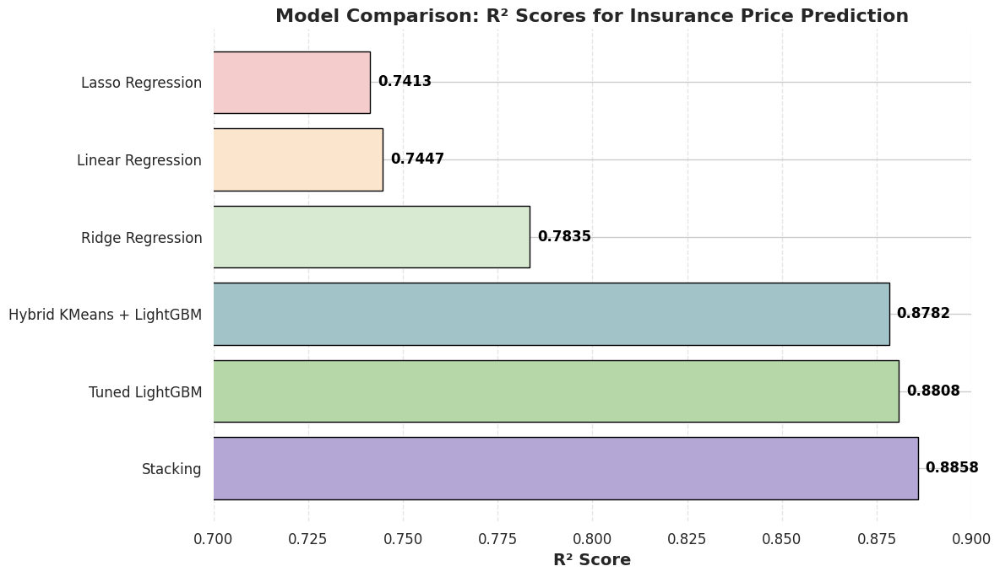

In [ ]:
import matplotlib.pyplot as plt

# Updated models and R² scores with Hybrid model added
models = [
    'Lasso Regression',
    'Linear Regression',
    'Ridge Regression',
    'Hybrid KMeans + LightGBM',
    'Tuned LightGBM',
    'Stacking'
]
r2_scores = [0.7413, 0.7447, 0.7835, 0.8782, 0.8808, 0.8858]
colors = ['#f4cccc', '#fce5cd', '#d9ead3', '#a2c4c9', '#b6d7a8', '#b4a7d6']

# Plotting the beautified horizontal bar chart
plt.figure(figsize=(12, 7))
bars = plt.barh(models, r2_scores, color=colors, edgecolor='black')

# Add text labels to bars
for bar in bars:
    plt.text(bar.get_width() + 0.002, bar.get_y() + bar.get_height()/2,
             f'{bar.get_width():.4f}', va='center', fontsize=12, fontweight='bold', color='black')

# Styling
plt.xlabel('R² Score', fontsize=14, weight='bold')
plt.title('Model Comparison: R² Scores for Insurance Price Prediction', fontsize=16, weight='bold')
plt.xlim(0.70, 0.90)
plt.gca().invert_yaxis()  # Highest score at the top
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.box(False)

plt.show()


In [ ]:
print("Number of features after encoding:", X.shape[1])
print("Feature names:", X.columns.tolist())


Number of features after encoding: 9
Feature names: ['age', 'bmi', 'children', 'sex_male', 'smoker_yes', 'region_northwest', 'region_southeast', 'region_southwest', 'cluster']


In [ ]:
['age', 'bmi', 'children', 'sex_male', 'smoker_yes', 'region_northwest', 'region_southeast', 'region_southwest']


['age',
 'bmi',
 'children',
 'sex_male',
 'smoker_yes',
 'region_northwest',
 'region_southeast',
 'region_southwest']

In [ ]:
input_data = np.array([[31, 25.74, 0, 1, 1, 0, 0, 0]])  # 8 features


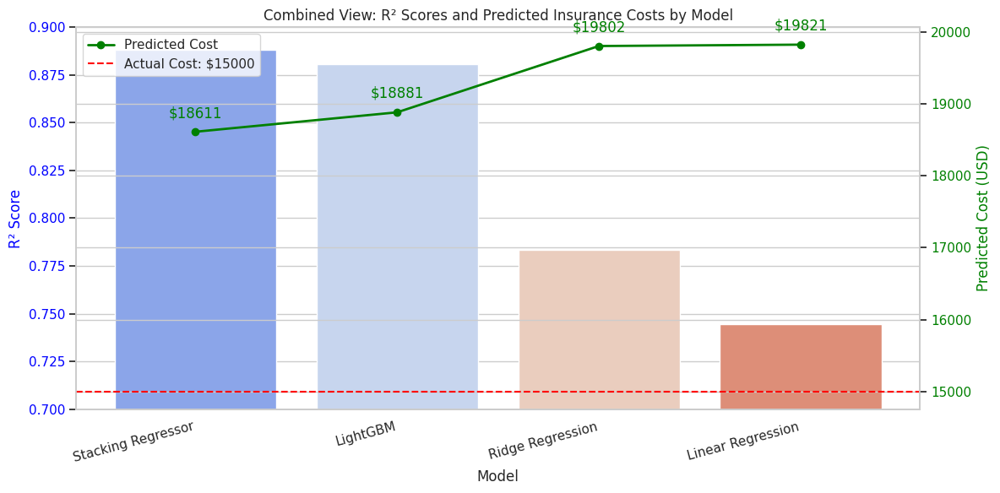

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Data from your analysis
data = {
    'Model': ['Stacking Regressor', 'LightGBM', 'Ridge Regression', 'Linear Regression'],
    'R2_Score': [0.8880, 0.8808, 0.7835, 0.7447],
    'Predicted_Cost': [18611, 18881, 19802, 19821]
}

actual_cost = 15000

df = pd.DataFrame(data)

# Set plot style
sns.set(style="whitegrid")
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plotting R² Score as bar plot
sns.barplot(x='Model', y='R2_Score', data=df, palette='coolwarm', ax=ax1)
ax1.set_ylabel('R² Score', color='blue')
ax1.set_ylim(0.7, 0.9)
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_xticklabels(df['Model'], rotation=15, ha='right')

# Create second y-axis for predicted cost
ax2 = ax1.twinx()
ax2.plot(df['Model'], df['Predicted_Cost'], color='green', marker='o', linewidth=2, label='Predicted Cost')
ax2.axhline(y=actual_cost, color='red', linestyle='--', label=f'Actual Cost: ${actual_cost}')
ax2.set_ylabel('Predicted Cost (USD)', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Annotating predicted costs
for i, cost in enumerate(df['Predicted_Cost']):
    ax2.text(i, cost + 200, f"${cost}", ha='center', color='green')

# Titles and legend
plt.title("Combined View: R² Scores and Predicted Insurance Costs by Model")
ax2.legend(loc='upper left')

plt.tight_layout()
plt.show()


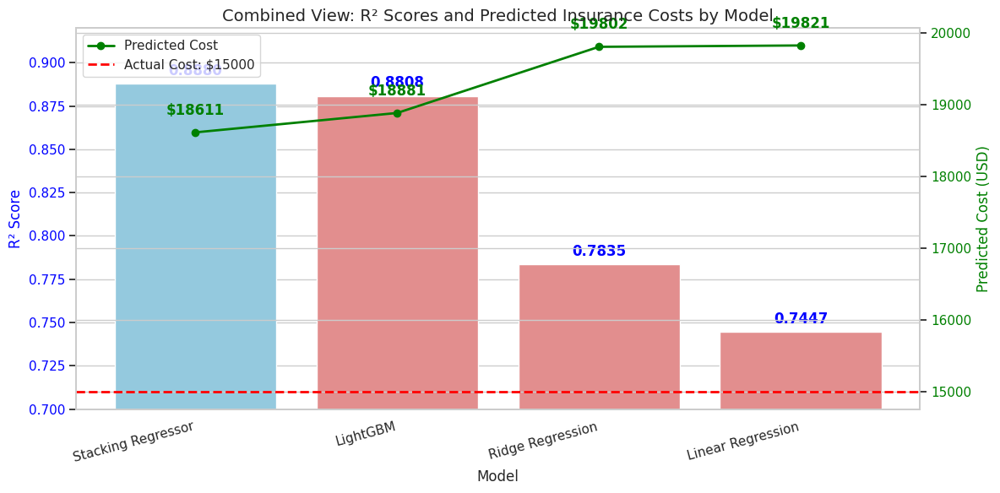

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Data
data = {
    'Model': ['Stacking Regressor', 'LightGBM', 'Ridge Regression', 'Linear Regression'],
    'R2_Score': [0.8880, 0.8808, 0.7835, 0.7447],
    'Predicted_Cost': [18611, 18881, 19802, 19821]
}
actual_cost = 15000
df = pd.DataFrame(data)

# Style
sns.set(style="whitegrid")
fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar plot for R² scores
bar_colors = ['skyblue' if 'Regressor' in model else 'lightcoral' for model in df['Model']]
bars = sns.barplot(x='Model', y='R2_Score', data=df, palette=bar_colors, ax=ax1)

ax1.set_ylabel('R² Score', color='blue', fontsize=12)
ax1.set_ylim(0.7, 0.92)
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_xticklabels(df['Model'], rotation=15, ha='right', fontsize=11)

# Annotate R² scores
for i, r2 in enumerate(df['R2_Score']):
    ax1.text(i, r2 + 0.005, f"{r2:.4f}", ha='center', color='blue', fontweight='bold')

# Second axis for cost
ax2 = ax1.twinx()
ax2.plot(df['Model'], df['Predicted_Cost'], color='green', marker='o', linewidth=2, label='Predicted Cost')
ax2.axhline(y=actual_cost, color='red', linestyle='--', linewidth=2, label=f'Actual Cost: ${actual_cost}')
ax2.set_ylabel('Predicted Cost (USD)', color='green', fontsize=12)
ax2.tick_params(axis='y', labelcolor='green')

# Annotate predicted costs
for i, cost in enumerate(df['Predicted_Cost']):
    ax2.text(i, cost + 250, f"${cost}", ha='center', color='green', fontweight='bold')

# Title and legend
plt.title("Combined View: R² Scores and Predicted Insurance Costs by Model", fontsize=14)
ax2.legend(loc='upper left', fontsize=11)

plt.tight_layout()
plt.show()


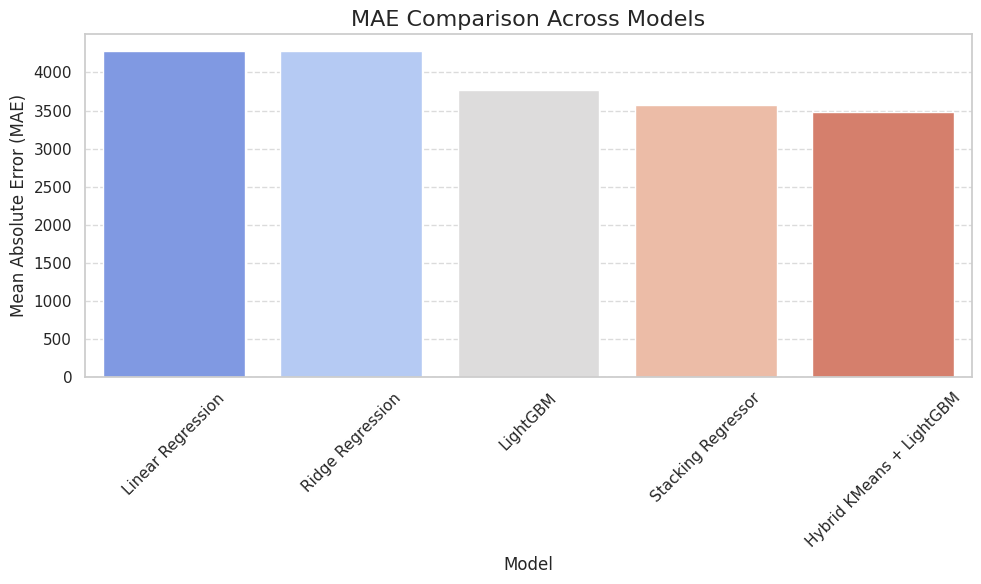

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming you have a DataFrame like this (based on your previous analysis)
# You can adapt this dictionary if you already have results stored elsewhere
results = {
    "Linear Regression": {"MAE": 4285.41},
    "Ridge Regression": {"MAE": 4282.71},
    "LightGBM": {"MAE": 3764.54},
    "Stacking Regressor": {"MAE": 3578.66},
    "Hybrid KMeans + LightGBM": {"MAE": 3482.77}
}

# Convert to DataFrame
mae_df = pd.DataFrame(results).T.reset_index()
mae_df.columns = ['Model', 'MAE']

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='MAE', data=mae_df, palette='coolwarm')
plt.title('MAE Comparison Across Models', fontsize=16)
plt.xlabel('Model')
plt.ylabel('Mean Absolute Error (MAE)')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig("model_mae_comparison.png", dpi=300)
plt.show()


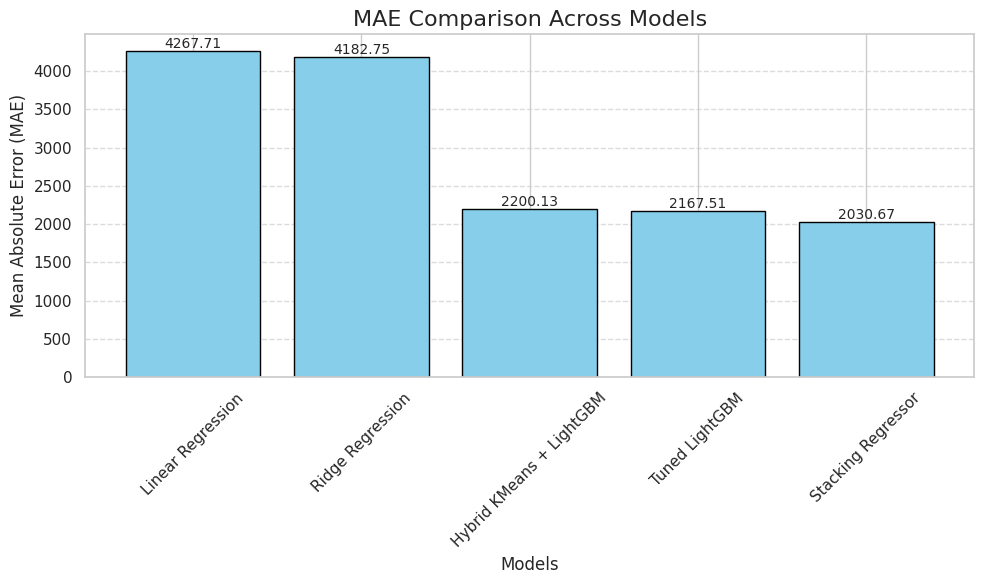

In [ ]:
import matplotlib.pyplot as plt

# Model names and their MAE values
mae_scores = {
    "Linear Regression": 4267.71,
    "Ridge Regression": 4182.75,
    "Hybrid KMeans + LightGBM": 2200.13,
    "Tuned LightGBM": 2167.51,
    "Stacking Regressor": 2030.67
}

# Prepare data for plotting
model_names = list(mae_scores.keys())
mae_values = list(mae_scores.values())

# Plotting
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, mae_values, color='skyblue', edgecolor='black')
plt.title('MAE Comparison Across Models', fontsize=16)
plt.xlabel('Models')
plt.ylabel('Mean Absolute Error (MAE)')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add MAE value labels on each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, height, f'{height:.2f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

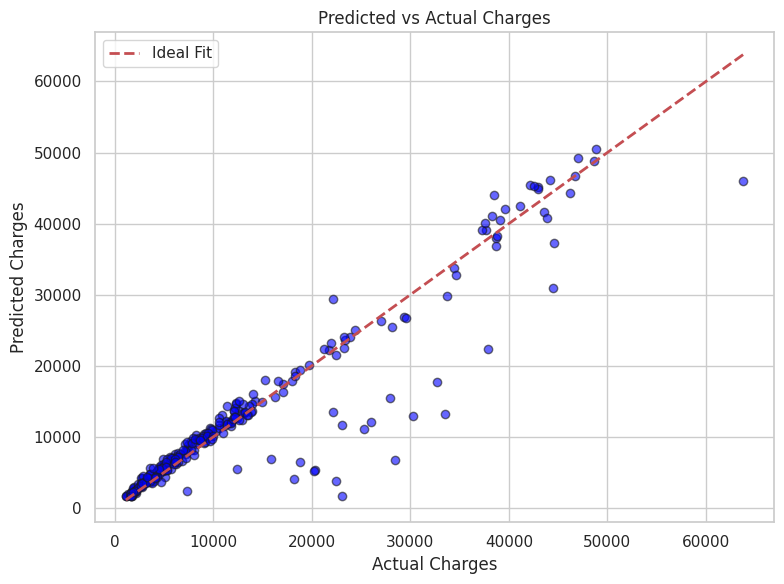

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming these are your predicted and actual values (use your actual variables if different)
# y_pred and y_true must be defined already (from your final model)
# For example:
# y_pred = np.expm1(model.predict(X_test))
# y_true = np.expm1(y_test)

plt.figure(figsize=(8, 6))
plt.scatter(y_true, y_pred, color='blue', alpha=0.6, edgecolor='k')
plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], 'r--', lw=2, label='Ideal Fit')
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Predicted vs Actual Charges')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("predicted_vs_actual.png", dpi=300)
plt.show()


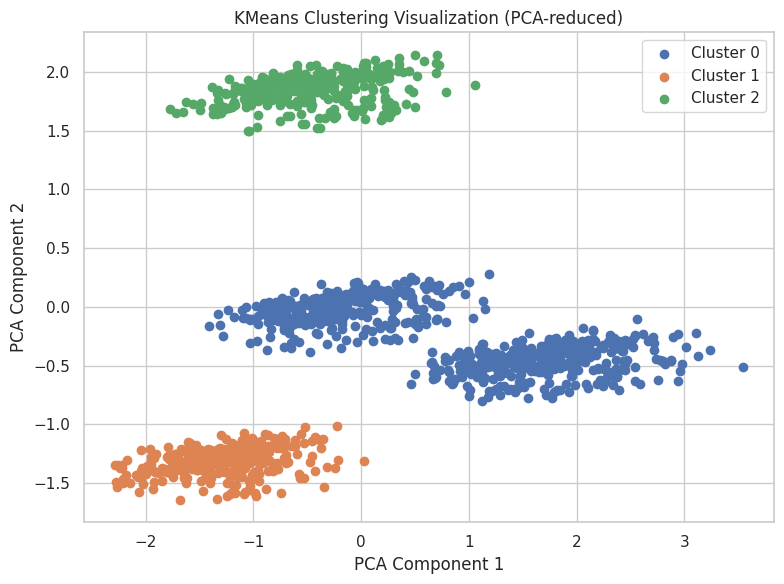

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Ensure KMeans is already fitted on X_scaled
# kmeans = KMeans(n_clusters=best_k, random_state=42)
# X_scaled = scaler.fit_transform(X)

# Reduce to 2 principal components
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Get cluster labels from your fitted model
cluster_labels = kmeans.predict(X_scaled)

# Plot PCA-reduced data with clusters
plt.figure(figsize=(8, 6))
for cluster in np.unique(cluster_labels):
    plt.scatter(
        X_pca[cluster_labels == cluster, 0],
        X_pca[cluster_labels == cluster, 1],
        label=f'Cluster {cluster}'
    )

plt.title('KMeans Clustering Visualization (PCA-reduced)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("kmeans_clusters.png", dpi=300)
plt.show()


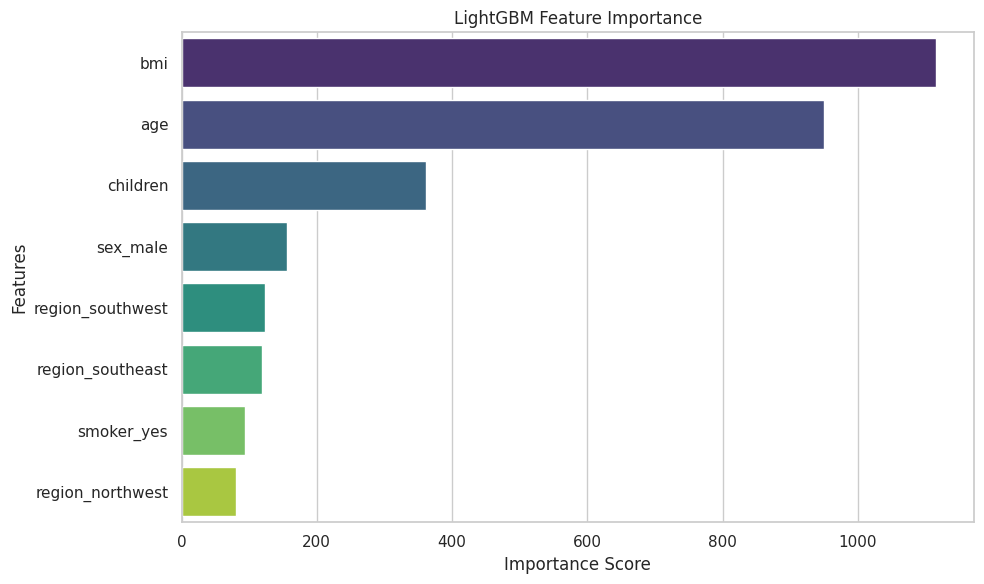

In [ ]:
# Get feature importances from the trained LightGBM model
importances = best_lgb.feature_importances_
feature_names = X.columns  # original feature names before scaling

# Ensure feature_names and importances have the same length
# by excluding the cluster column from feature_names
feature_names = feature_names[feature_names != 'cluster']

# Create a DataFrame for sorting
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')
plt.title('LightGBM Feature Importance')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.tight_layout()
plt.savefig('lightgbm_feature_importance.png', dpi=300)
plt.show()

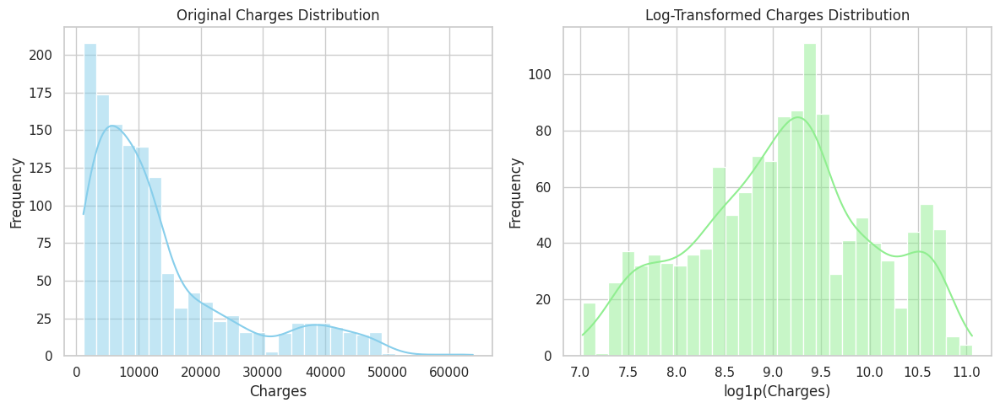

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Original and log-transformed charges
original_charges = pd.read_csv('/content/insurance.csv')['charges']
log_charges = np.log1p(original_charges)

# Plot side-by-side histograms
plt.figure(figsize=(12, 5))

# Before log transform
plt.subplot(1, 2, 1)
sns.histplot(original_charges, kde=True, bins=30, color='skyblue')
plt.title('Original Charges Distribution')
plt.xlabel('Charges')
plt.ylabel('Frequency')

# After log transform
plt.subplot(1, 2, 2)
sns.histplot(log_charges, kde=True, bins=30, color='lightgreen')
plt.title('Log-Transformed Charges Distribution')
plt.xlabel('log1p(Charges)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.savefig('charges_distribution.png', dpi=300)
plt.show()


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 320
[LightGBM] [Info] Number of data points in the train set: 856, number of used features: 9
[LightGBM] [Info] Start training from score 9.107244
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 322
[LightGBM] [Info]

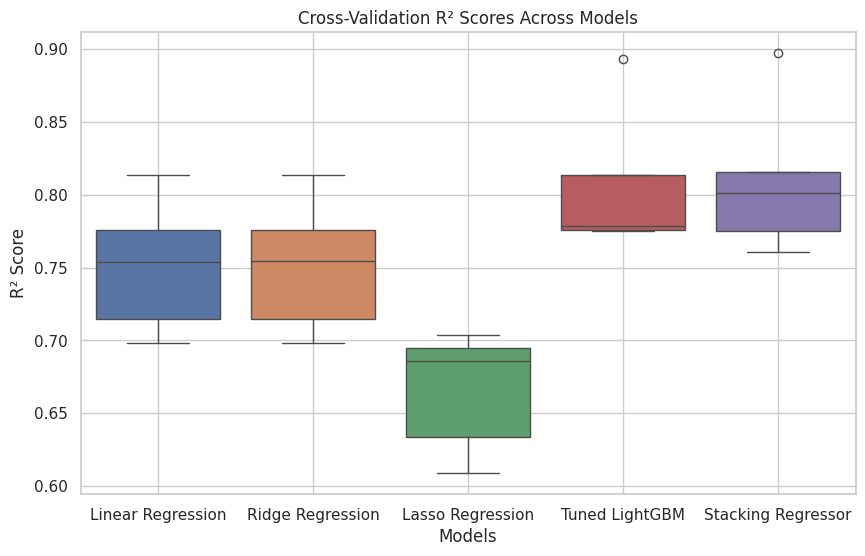

In [ ]:
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
import seaborn as sns

# Define models
from sklearn.linear_model import LinearRegression, Ridge, Lasso
import lightgbm as lgb
from sklearn.ensemble import StackingRegressor

# Assuming best_lgb and stacking_model are already defined
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Lasso Regression": Lasso(alpha=0.1),
    "Tuned LightGBM": best_lgb,
    "Stacking Regressor": stacking_model
}

# Compute cross-validation scores
cv_scores = {}
for name, model in models.items():
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')
    cv_scores[name] = scores

# Convert to DataFrame
cv_df = pd.DataFrame(cv_scores)

# Plot boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=cv_df)
plt.title("Cross-Validation R² Scores Across Models")
plt.ylabel("R² Score")
plt.xlabel("Models")
plt.grid(True)
plt.savefig("cross_validation_scores.png", dpi=300)
plt.show()
